In [2]:
import os

import copy
import pickle
import random
import tslearn
import warnings
import itertools
import numpy as np
import pandas as pd
import importlib as imp

from tqdm import tqdm
from scipy import stats
from pprint import pprint
from fastdtw import fastdtw
from collections import Counter
from functools import partial
from multiprocessing import cpu_count
from matplotlib import pyplot as plt
from matplotlib import patches as mpatches
from matplotlib.collections import LineCollection
from simple_helpers import parallel_progress
from scipy.spatial.distance import euclidean
from sklearn.metrics import accuracy_score, auc, roc_curve, f1_score, matthews_corrcoef
from tslearn.neighbors import KNeighborsTimeSeriesClassifier

from datetime import datetime
from dateutil.relativedelta import relativedelta
from IPython.core.display import display, HTML, Markdown
from IPython.core.interactiveshell import InteractiveShell

import train
import zscore
import preprocess
import build_features

In [3]:
%matplotlib inline
%config InlineBackend.figure_format = 'retina'

pd.set_option('display.max_columns', 1000)
pd.set_option('display.max_rows', 1000)
display(HTML("<style>.container {width:95% !important; }</style>"))

warnings.simplefilter(action='ignore', category=FutureWarning)

def printmd(string, color=None):
    colorstr = "<span style='color:{}'>{}</span>".format(color, string)
    display(Markdown(colorstr))

In [4]:
agex_low = 4.0 # lower bound on data to be used for y (in years)
agex_high = 6.0 # upper bound on data to be used for y (in years)
months_from = 0 # lower bound on data to be used for X (in months)
months_to = 24 # upper bound on data to be used for X (in months)
label_ix = {
    'underweight':0,'normal':1,'overweight':2,'obese':3,
    'class I severe obesity':4,'class II severe obesity':5, 'none':6
}

In [5]:
data1 = {
#     'x1': x,
#     'y1': y,
#     'y1_label': ylabel,
#     'feature_headers1': feature_headers,
#     'mrns1': mrns,
    'data_dict': pickle.load(open('../python objects/patientdata_20170823.pkl', 'rb')) # first cohort data,
}
data2 = {
#     'x1': x,
#     'y1': y,
#     'y1_label': ylabel,
#     'feature_headers1': feature_headers,
#     'mrns1': mrns,
    'data_dict': pickle.load(open('../python objects/patient_data_2_20181004.pkl', 'rb')) # second cohort data,
}

In [6]:
params = {
    'prediction': 'multi',
    'pred_age_low': agex_low,
    'pred_age_high': agex_high,
    'months_from': months_from,
    'months_to': months_to,
    'require_maternal': False,
    'require_vital': True,
    'filter_percentile_more_than_percent': 5,
    'build_from_scratch': True,
    'variable_subset': [
        'Gender',
        'Vital: Ht-', 'Vital: Wt-', 'Vital: BMI-', 
        'Vital: Wt for Length ZScore', 'Vital: BMI ZScore'
    ],
    'label_build': 'multi',
    'prediction': 'obese',
    'do_impute': False,
    'do_normalize': False
}

In [7]:
d1 = preprocess.preprocess(data1, params)
d2 = preprocess.preprocess(data2, params)

In [8]:
f1 = '../python objects/patient_data_1_processed_20190424.npz'
f2 = '../python objects/patient_data_2_processed_20190424.npz'

if os.path.exists(f1):
    print('loading saved data for cohort 1')
    data = np.load('../python objects/patient_data_1_processed_20190424.npz')
    data1 = {**data1, **data}
    
if os.path.exists(f2):
    print('loading saved data for cohort 2')
    data = np.load('../python objects/patient_data_2_processed_20190424.npz')
    data2 = {**data2, **data}

d1 = preprocess.preprocess(data1, params)
d2 = preprocess.preprocess(data2, params)

if d1.x2 is None:
    d1.preprocess()
    np.savez_compressed(
        '../python objects/patient_data_1_processed_20190424', 
        x1=d1.x1, x2=d1.x2,
        y1=d1.y1, y1_label=d1.y1_label, 
        y2=d1.y2, y2_label=d1.y2_label,
        feature_headers1=d1.feature_headers1, 
        feature_headers2=d2.feature_headers2,
        ix_filter=d1.ix_filter,
        ix_feature_filter=d1.ix_feature_filter,
        mrns1=d1.mrns1, mrns2=d1.mrns2,
    )

if d2.x2 is None:
    d2.preprocess()
    np.savez_compressed(
        '../python objects/patient_data_2_processed_20190424', 
        x1=d2.x1, x2=d2.x2,
        y1=d2.y1, y1_label=d2.y1_label, 
        y2=d2.y2, y2_label=d2.y2_label,
        feature_headers1=d2.feature_headers1, 
        feature_headers2=d2.feature_headers2,
        ix_filter=d2.ix_filter,
        ix_feature_filter=d2.ix_feature_filter,
        mrns1=d2.mrns1, mrns2=d2.mrns2,
    )
    
del data

loading saved data for cohort 1
loading saved data for cohort 2


In [9]:
d1.x1.shape, d2.x1.shape

((52945, 19253), (75821, 19253))

In [10]:
d1.x2.shape, d2.x2.shape

((6535, 82), (6652, 82))

In [11]:
# f.split(':')[1].split('-')[0]]
vitals = ('Ht', 'Wt', 'BMI', 'Wt for Length ZScore')
vital_ix = {t: i for i, t in enumerate(vitals)}

# f.split(':')[1"].split('-')[1]
times = (
    'avg0to1', 'avg1to3', 'avg3to5', 'avg5to7', 'avg7to10', 
    'avg10to13', 'avg13to16', 'avg16to19', 'avg19to24'
)
time_ix = {t: i for i, t in enumerate(times)}

pprint(vital_ix)
pprint(time_ix)

{'BMI': 2, 'Ht': 0, 'Wt': 1, 'Wt for Length ZScore': 3}
{'avg0to1': 0,
 'avg10to13': 5,
 'avg13to16': 6,
 'avg16to19': 7,
 'avg19to24': 8,
 'avg1to3': 1,
 'avg3to5': 2,
 'avg5to7': 3,
 'avg7to10': 4}


In [12]:
def forward_fill(arr, by_rows=True, backfill_leading=False, reverse=False):
    if not by_rows:
        arr = arr.T
    if reverse:
        arr = arr[:, ::-1]
    mask = (arr == 0.)
    idx = np.where(~mask, np.arange(mask.shape[1]), 0)
    np.maximum.accumulate(idx, axis=1, out=idx)
    out = arr[np.arange(idx.shape[0])[:,None], idx]
    if reverse:
        out = out[:, ::-1]
    if not by_rows:
        out = out.T
    if backfill_leading:
        out = forward_fill(out.T[:, ::-1], by_rows=~by_rows, reverse=reverse)[:, ::-1].T
    return out

def linear_interpolation(arr, by_rows=True):
    if not by_rows:
        arr = arr.T
    indices = np.arange(arr.shape[1])
    for i in range(arr.shape[0]):
        mask = (arr[i] != 0.)
        if mask.sum() ==0:
            continue
        arr[i] = np.interp(indices, indices[mask], arr[i, mask])
    if not by_rows:
        arr = arr.T
    return arr

In [13]:
ft_filter = np.array([
    (f.startswith('Vital') 
     and f.split(':')[1].split('-')[0].strip() in vitals 
     and f.split(':')[1].split('-')[1].strip() in times) 
    for f in d1.feature_headers2
])
x2 = d1.x2[:, ft_filter]
fts = d1.feature_headers2[ft_filter]

ix_vital_filter = ((x2 != 0).sum(axis=1) != 0)
x2 = x2[ix_vital_filter]
ix_girls = (d1.x2[:, 1] == 1)[ix_vital_filter]
ix_boys = (d1.x2[:, 0] == 1)[ix_vital_filter]

y2 = d1.y2[ix_vital_filter]
y2_label = d1.y2_label[ix_vital_filter]

In [14]:
ymean = y2.mean()
ystd = y2.std()
ynorm = (y2 - ymean) / ystd

In [15]:
ft_order = {} # {feature name: (row number, column number)
for f in fts:
    vital = f.split(':')[1].split('-')
    c = vital_ix[vital[0].strip()]
    if len(vital) > 1:
        try:
            r = time_ix[vital[1].strip()]
        except:
            continue
    else:
        r = list(time_ix.values())
    ft_order[f] = [r, c]

In [16]:
x2_norm = np.zeros((x2.shape[0], len(time_ix), len(vital_ix)), dtype=float)
x2_nonorm = np.zeros((x2.shape[0], len(time_ix), len(vital_ix)), dtype=float)

x2_ffill_norm = np.zeros((x2.shape[0], len(time_ix), len(vital_ix)), dtype=float)
x2_ffill_nonorm = np.zeros((x2.shape[0], len(time_ix), len(vital_ix)), dtype=float)

x2_fbfill_norm = np.zeros((x2.shape[0], len(time_ix), len(vital_ix)), dtype=float)
x2_fbfill_nonorm = np.zeros((x2.shape[0], len(time_ix), len(vital_ix)), dtype=float)

x2_bfill_norm = np.zeros((x2.shape[0], len(time_ix), len(vital_ix)), dtype=float)
x2_bfill_nonorm = np.zeros((x2.shape[0], len(time_ix), len(vital_ix)), dtype=float)

x2_bffill_norm = np.zeros((x2.shape[0], len(time_ix), len(vital_ix)), dtype=float)
x2_bffill_nonorm = np.zeros((x2.shape[0], len(time_ix), len(vital_ix)), dtype=float)

x2_linterp_norm = np.zeros((x2.shape[0], len(time_ix), len(vital_ix)), dtype=float)
x2_linterp_nonorm = np.zeros((x2.shape[0], len(time_ix), len(vital_ix)), dtype=float)

for i in range(x2.shape[0]):
    for j, ft in enumerate(fts):
        if ft not in ft_order:
            continue
        r, c = ft_order[ft]
        x2_nonorm[i, r, c] = x2[i, j]
        
    x2_ffill_nonorm[i] = forward_fill(x2_nonorm[i], by_rows=False, reverse=False, backfill_leading=False) # forward fill missing data (aka 0.) by column
    x2_fbfill_nonorm[i] = forward_fill(x2_nonorm[i], by_rows=False, reverse=False, backfill_leading=True) # forward fill missing data (aka 0.) by column and backward fill leading zeros
    x2_bfill_nonorm[i] = forward_fill(x2_nonorm[i], by_rows=False, reverse=True, backfill_leading=False) # backward fill missing data (aka 0.) by column
    x2_bffill_nonorm[i] = forward_fill(x2_nonorm[i], by_rows=False, reverse=True, backfill_leading=True) # backward fill missing data (aka 0.) by column and forward fill trailing zeros
    x2_linterp_nonorm[i] = linear_interpolation(x2_nonorm[i], by_rows=False) # linearly interpolate missing data (aka 0.) by column

In [17]:
x2_mean = x2_nonorm.mean(axis=0)
x2_ffill_mean = x2_ffill_nonorm.mean(axis=0)
x2_fbfill_mean = x2_fbfill_nonorm.mean(axis=0)
x2_bfill_mean = x2_bfill_nonorm.mean(axis=0)
x2_bffill_mean = x2_bffill_nonorm.mean(axis=0)
x2_linterp_mean = x2_linterp_nonorm.mean(axis=0)

x2_std = x2_nonorm.std(axis=0)
x2_ffill_std = x2_ffill_nonorm.std(axis=0)
x2_fbfill_std = x2_fbfill_nonorm.std(axis=0)
x2_bfill_std = x2_bfill_nonorm.std(axis=0)
x2_bffill_std = x2_bffill_nonorm.std(axis=0)
x2_linterp_std = x2_linterp_nonorm.std(axis=0)

x2_norm = (x2_nonorm - x2_mean) / x2_std
x2_ffill_norm = (x2_ffill_nonorm - x2_ffill_mean) / x2_ffill_std
x2_fbfill_norm = (x2_fbfill_nonorm - x2_fbfill_mean) / x2_fbfill_std
x2_bfill_norm = (x2_bfill_nonorm - x2_bfill_mean) / x2_bfill_std
x2_bffill_norm = (x2_bffill_nonorm - x2_bffill_mean) / x2_bffill_std
x2_linterp_norm = (x2_linterp_nonorm - x2_linterp_mean) / x2_linterp_std

In [18]:
col = vital_ix['Wt for Length ZScore']

_time = np.arange(len(time_ix))
xvals = np.array([_time] * x2.shape[0])
xvals_obese = np.array([_time] * int(y2_label.sum()))
xvals_not_obese = np.array([_time] * int(x2.shape[0] - y2_label.sum()))

data = np.stack((xvals, x2_nonorm[:, :, col]), axis=2)
data_linterp = np.stack((xvals, x2_linterp_nonorm[:, :, col]), axis=2)
data_obese = np.stack((xvals_obese, x2_nonorm[(y2_label == 1), :, col]), axis=2)
data_not_obese = np.stack((xvals_not_obese, x2_nonorm[(y2_label != 1), :, col]), axis=2)

data_linterp_obese = np.stack((xvals_obese, x2_linterp_nonorm[(y2_label == 1), :, col]), axis=2)
data_linterp_not_obese = np.stack((xvals_not_obese, x2_linterp_nonorm[(y2_label != 1), :, col]), axis=2)

data_norm = np.stack((xvals, x2_norm[:, :, col]), axis=2)
data_obese_norm = np.stack((xvals_obese, x2_norm[(y2_label == 1), :, col]), axis=2)
data_not_obese_norm = np.stack((xvals_not_obese, x2_norm[(y2_label != 1), :, col]), axis=2)

data_linterp_norm = np.stack((xvals, x2_linterp_norm[:, :, col]), axis=2)
data_linterp_obese_norm = np.stack((xvals_obese, x2_linterp_norm[(y2_label == 1), :, col]), axis=2)
data_linterp_not_obese_norm = np.stack((xvals_not_obese, x2_linterp_norm[(y2_label != 1), :, col]), axis=2)

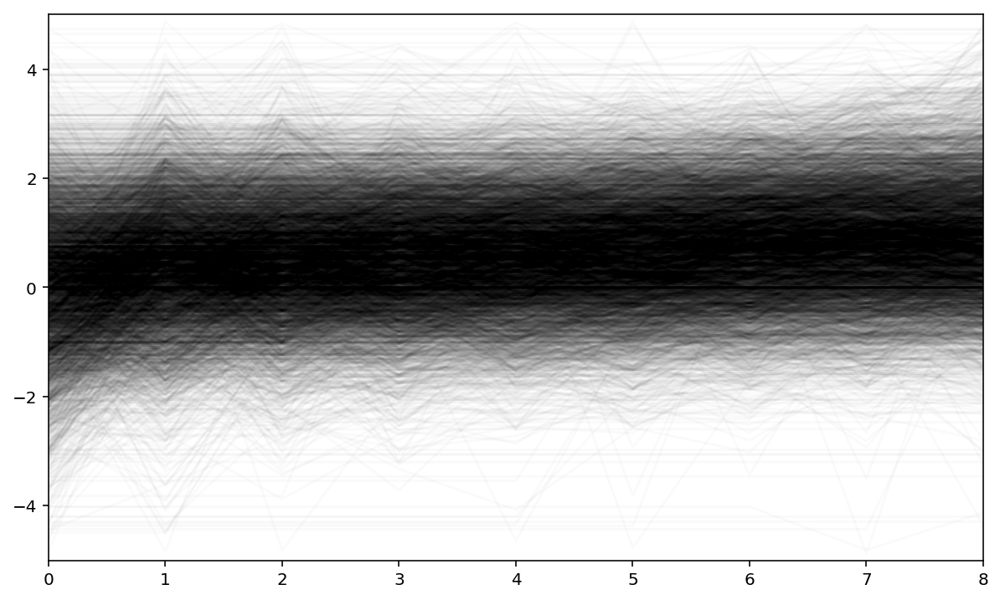

In [19]:
fig, ax = plt.subplots(figsize=(10,6))
ax.add_collection(LineCollection(data, colors='black', linestyle='solid', alpha=0.02));

ax.set_xlim(0, 8)
ax.set_ylim(-5, 5)

plt.show()

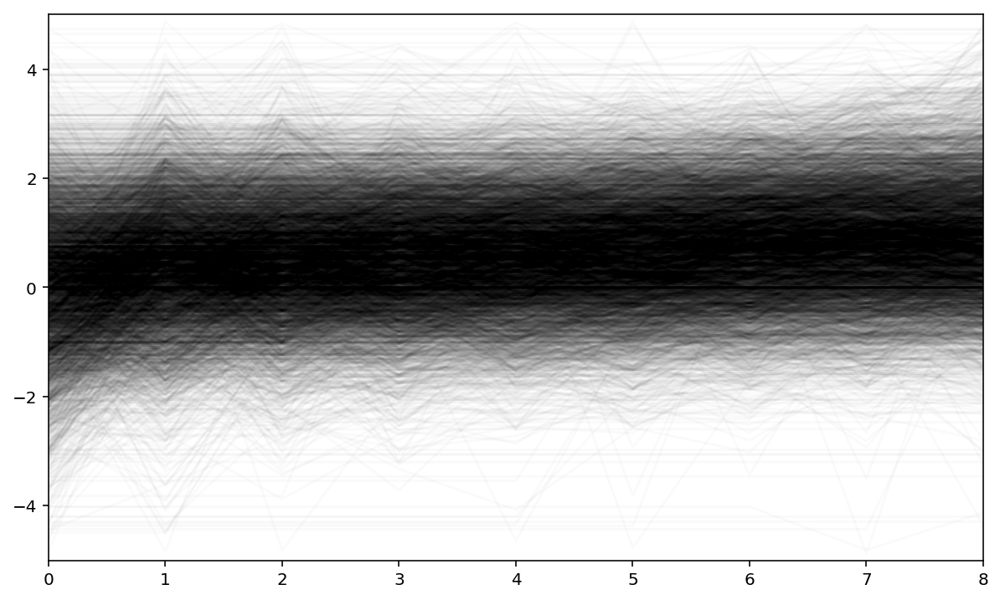

In [20]:
fig, ax = plt.subplots(figsize=(10,6))
ax.add_collection(LineCollection(data_linterp, colors='black', linestyle='solid', alpha=0.02));

ax.set_xlim(0, 8)
ax.set_ylim(-5, 5)

plt.show()

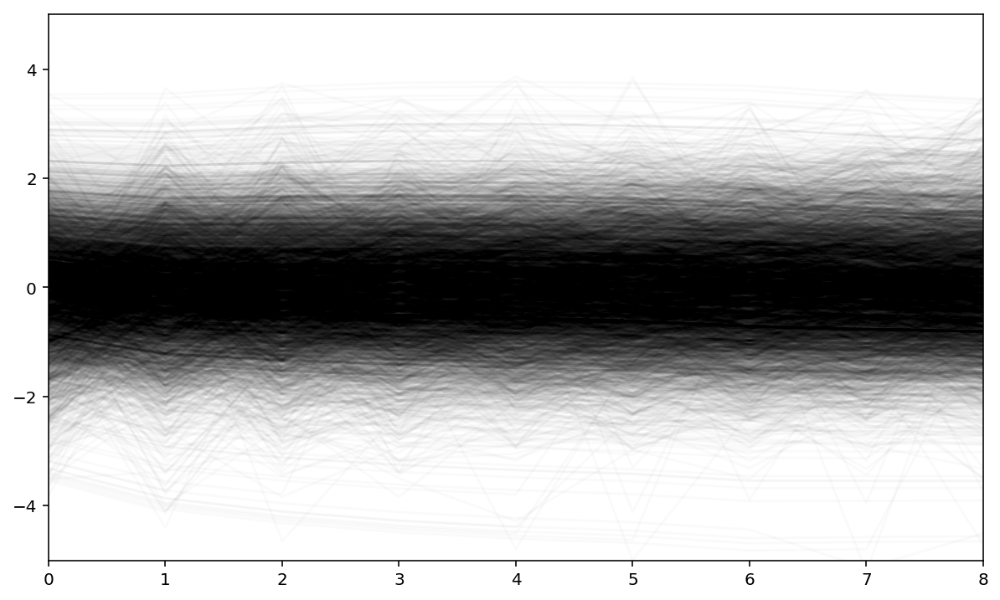

In [21]:
fig, ax = plt.subplots(figsize=(10,6))
ax.add_collection(LineCollection(data_norm, colors='black', linestyle='solid', alpha=0.02));

ax.set_xlim(0, 8)
ax.set_ylim(-5, 5)

plt.show()

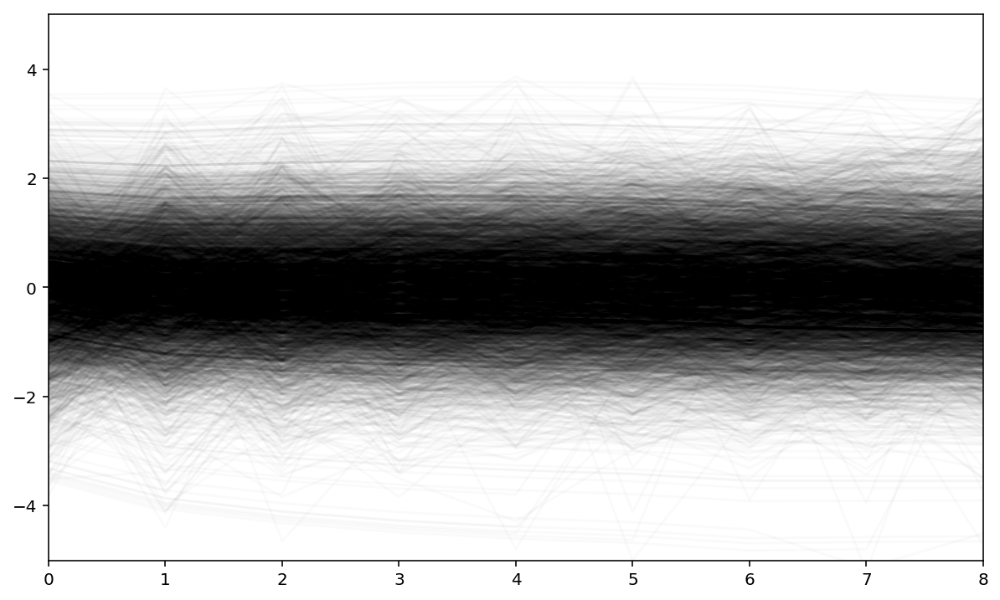

In [22]:
fig, ax = plt.subplots(figsize=(10,6))
ax.add_collection(LineCollection(data_linterp_norm, colors='black', linestyle='solid', alpha=0.02));

ax.set_xlim(0, 8)
ax.set_ylim(-5, 5)

plt.show()

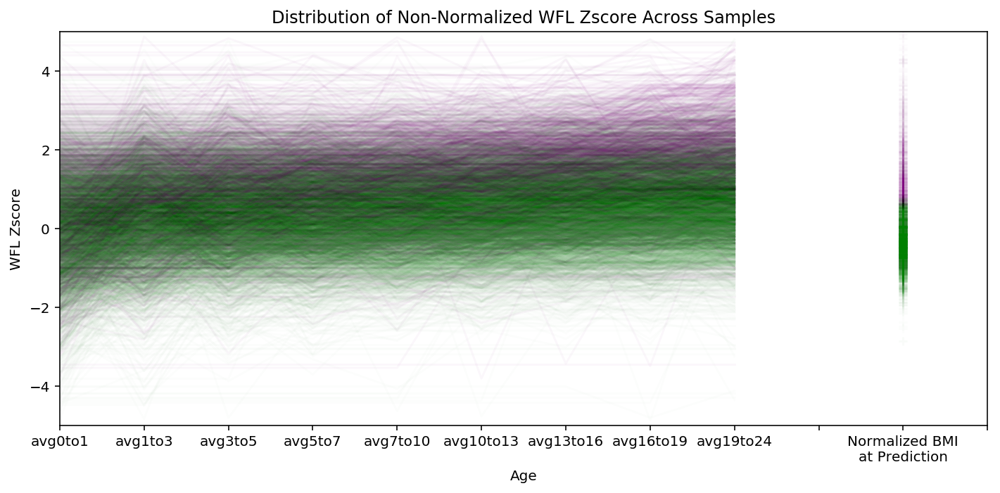

In [23]:
fig, ax = plt.subplots(figsize=(10,5))
for i in range(x2_nonorm.shape[0]):
    color = 'purple' if (y2_label[i] == 1) else 'green'
    a = 0.01 if color == 'green' else 0.03
    wfl = x2_nonorm[i, :, col]
    mask = (wfl != 0.)
    ax.plot(_time[mask], x2_nonorm[i, mask, col], c=color, linestyle='solid', alpha=a)
    
    ax.scatter(10, ynorm[i], c=color, marker='+', alpha=0.01)

ax.set_xlim(0, 10)
ax.set_ylim(-5, 5)

xticklabel = [t for t in time_ix.keys()]
xticklabel.extend(['','Normalized BMI\nat Prediction'])
ax.set_xticks(range(0, 12))
ax.set_xticklabels(xticklabel)

ax.set_xlabel('Age')
ax.set_ylabel('WFL Zscore')
ax.set_title('Distribution of Non-Normalized WFL Zscore Across Samples')

plt.tight_layout()
plt.savefig('WFL_Z_plot_w_label.png', dpi=300, bbox_to_inches=True)
plt.show()

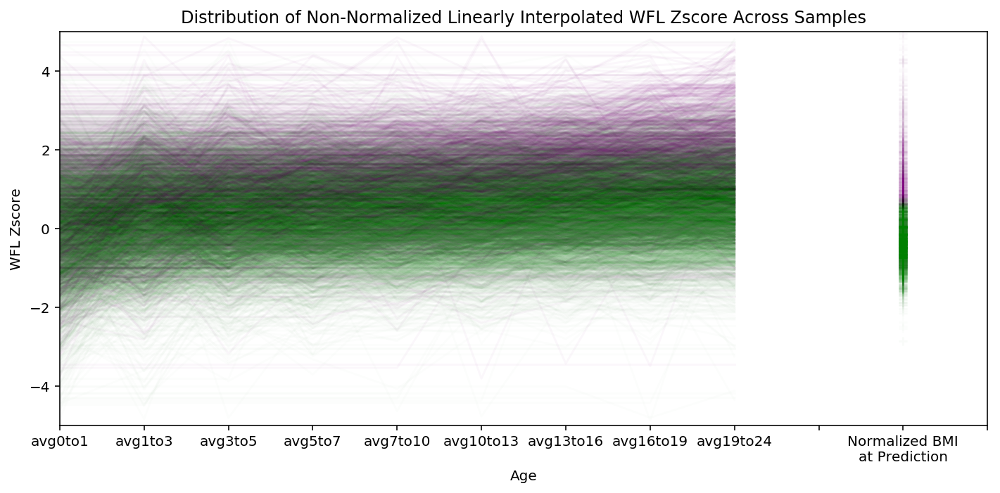

In [24]:
fig, ax = plt.subplots(figsize=(10,5))
for i in range(x2_nonorm.shape[0]):
    color = 'purple' if (y2_label[i] == 1) else 'green'
    a = 0.01 if color == 'green' else 0.03
    wfl = x2_linterp_nonorm[i, :, col]
    mask = (wfl != 0.)
    ax.plot(_time[mask], x2_linterp_nonorm[i, mask, col], c=color, linestyle='solid', alpha=a)
    
    ax.scatter(10, ynorm[i], c=color, marker='+', alpha=0.01)

ax.set_xlim(0, 10)
ax.set_ylim(-5, 5)

xticklabel = [t for t in time_ix.keys()]
xticklabel.extend(['','Normalized BMI\nat Prediction'])
ax.set_xticks(range(0, 12))
ax.set_xticklabels(xticklabel)

ax.set_xlabel('Age')
ax.set_ylabel('WFL Zscore')
ax.set_title('Distribution of Non-Normalized Linearly Interpolated WFL Zscore Across Samples')

plt.tight_layout()
# plt.savefig('WFL_Z_plot_w_label.png', dpi=300, bbox_to_inches=True)
plt.show()

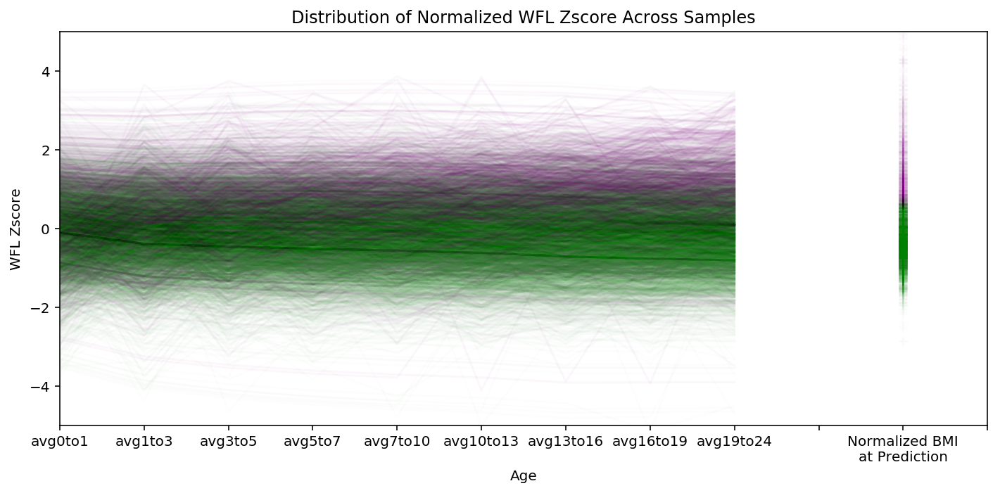

In [25]:
fig, ax = plt.subplots(figsize=(10,5))
for i in range(x2_norm.shape[0]):
    color = 'purple' if (y2_label[i] == 1) else 'green'
    a = 0.01 if color == 'green' else 0.03
    wfl = x2_norm[i, :, col]
    mask = (wfl != 0.)
    ax.plot(_time[mask], x2_norm[i, mask, col], c=color, linestyle='solid', alpha=a)
    
    ax.scatter(10, ynorm[i], c=color, marker='+', alpha=0.01)

ax.set_xlim(0, 10)
ax.set_ylim(-5, 5)

xticklabel = [t for t in time_ix.keys()]
xticklabel.extend(['','Normalized BMI\nat Prediction'])
ax.set_xticks(range(0, 12))
ax.set_xticklabels(xticklabel)

ax.set_xlabel('Age')
ax.set_ylabel('WFL Zscore')
ax.set_title('Distribution of Normalized WFL Zscore Across Samples')

plt.tight_layout()
plt.savefig('Normalized_WFL_Z_plot_w_label.png', dpi=300, bbox_to_inches=True)
plt.show()

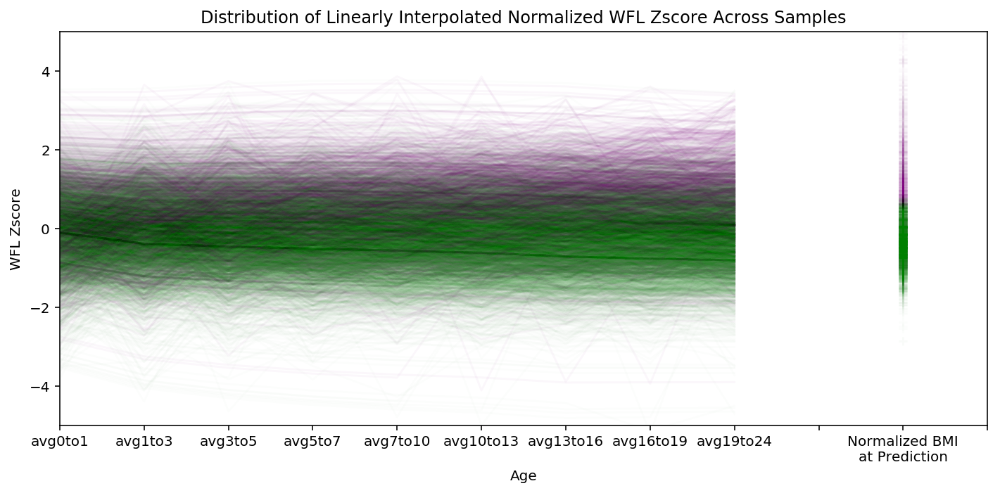

In [26]:
fig, ax = plt.subplots(figsize=(10,5))
for i in range(x2_norm.shape[0]):
    color = 'purple' if (y2_label[i] == 1) else 'green'
    a = 0.01 if color == 'green' else 0.03
    wfl = x2_linterp_norm[i, :, col]
    mask = (wfl != 0.)
    ax.plot(_time[mask], x2_linterp_norm[i, mask, col], c=color, linestyle='solid', alpha=a)
    
    ax.scatter(10, ynorm[i], c=color, marker='+', alpha=0.01)

ax.set_xlim(0, 10)
ax.set_ylim(-5, 5)

xticklabel = [t for t in time_ix.keys()]
xticklabel.extend(['','Normalized BMI\nat Prediction'])
ax.set_xticks(range(0, 12))
ax.set_xticklabels(xticklabel)

ax.set_xlabel('Age')
ax.set_ylabel('WFL Zscore')
ax.set_title('Distribution of Linearly Interpolated Normalized WFL Zscore Across Samples')

plt.tight_layout()
# plt.savefig('Normalized_WFL_Z_plot_w_label.png', dpi=300, bbox_to_inches=True)
plt.show()

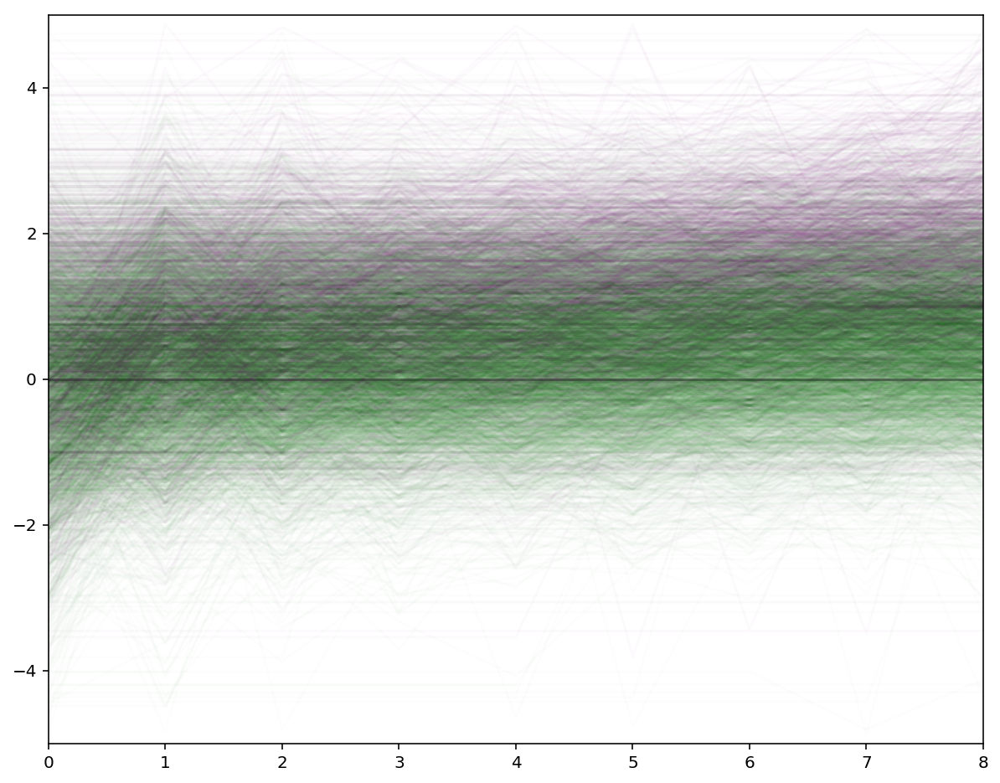

In [27]:
fig, ax = plt.subplots(figsize=(10,8))
ax.add_collection(LineCollection(data_not_obese, colors='green', linestyle='solid', alpha=0.01));
ax.add_collection(LineCollection(data_obese, colors='purple', linestyle='solid', alpha=0.02));

ax.set_xlim(0, 8)
ax.set_ylim(-5, 5)

plt.show()

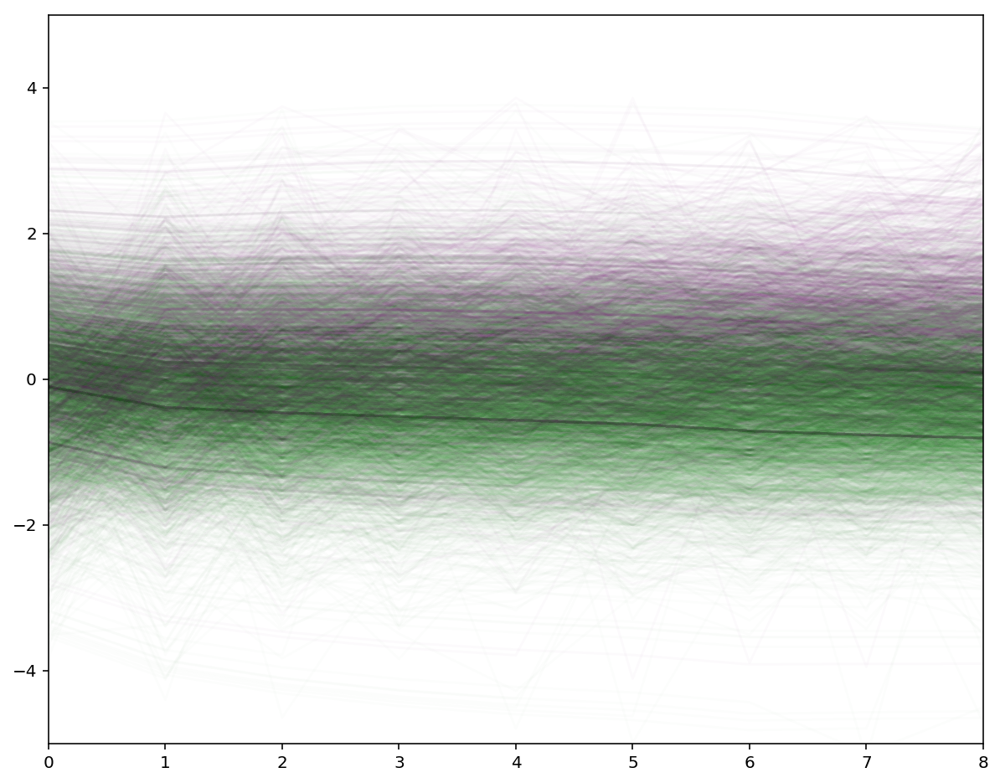

In [28]:
fig, ax = plt.subplots(figsize=(10,8))
ax.add_collection(LineCollection(data_not_obese_norm, colors='green', linestyle='solid', alpha=0.01));
ax.add_collection(LineCollection(data_obese_norm, colors='purple', linestyle='solid', alpha=0.02));

ax.set_xlim(0, 8)
ax.set_ylim(-5, 5)

plt.show()

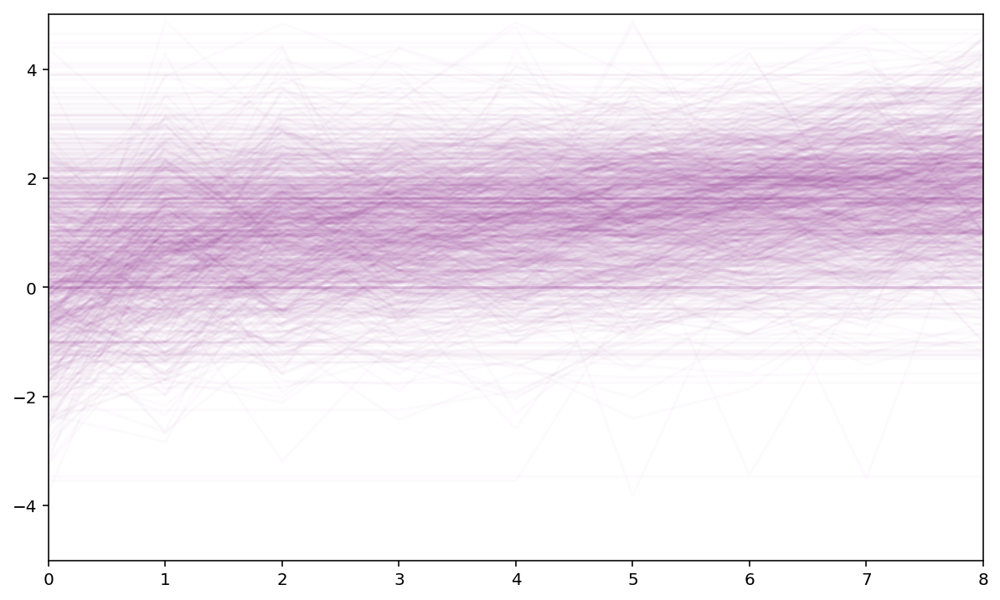

In [29]:
fig, ax = plt.subplots(figsize=(10,6))

ax.add_collection(LineCollection(data_obese, colors='purple', linestyle='solid', alpha=0.02));

ax.set_xlim(0, 8)
ax.set_ylim(-5, 5)

plt.show()

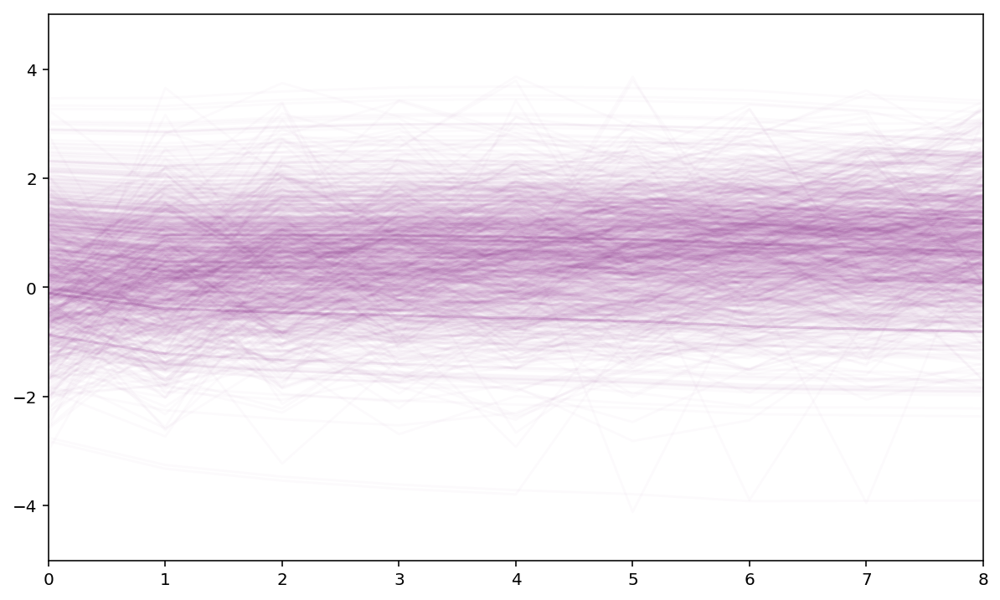

In [30]:
fig, ax = plt.subplots(figsize=(10,6))

ax.add_collection(LineCollection(data_obese_norm, colors='purple', linestyle='solid', alpha=0.02));

ax.set_xlim(0, 8)
ax.set_ylim(-5, 5)

plt.show()

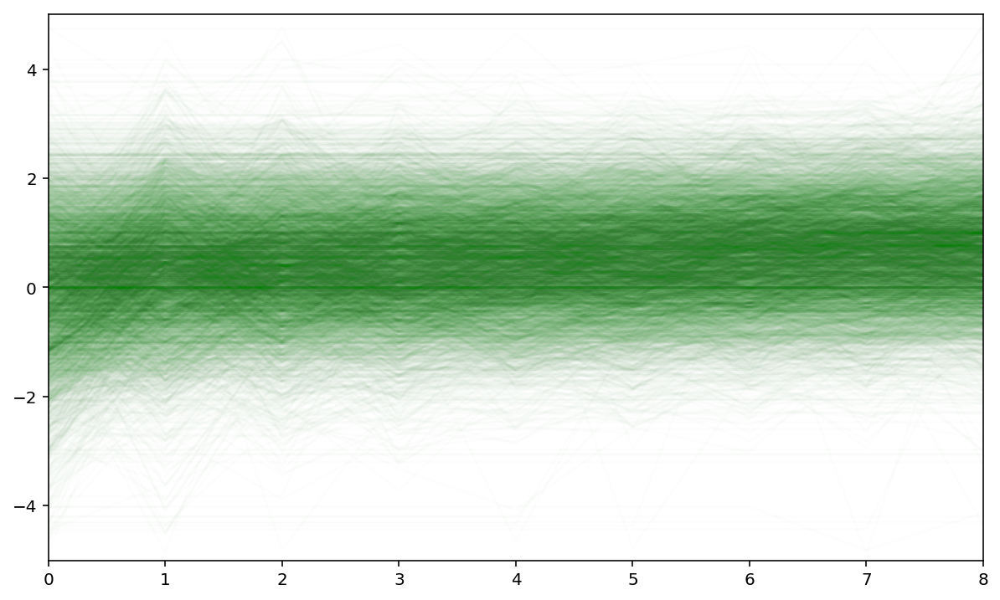

In [31]:
fig, ax = plt.subplots(figsize=(10,6))

ax.add_collection(LineCollection(data_not_obese, colors='green', linestyle='solid', alpha=0.01));

ax.set_xlim(0, 8)
ax.set_ylim(-5, 5)

plt.show()

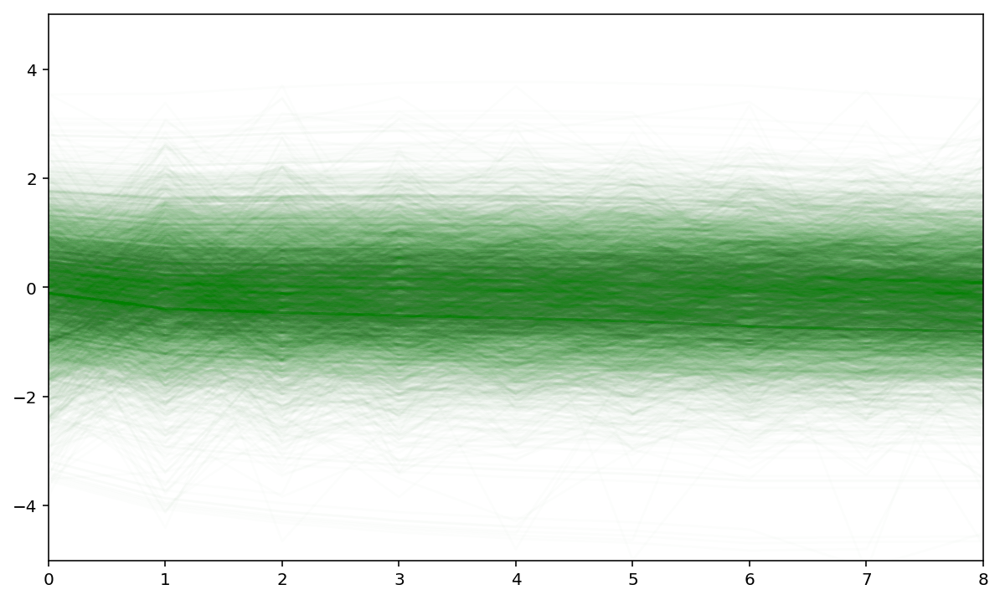

In [32]:
fig, ax = plt.subplots(figsize=(10,6))

ax.add_collection(LineCollection(data_not_obese_norm, colors='green', linestyle='solid', alpha=0.01));

ax.set_xlim(0, 8)
ax.set_ylim(-5, 5)

plt.show()

## Dynamic Time Warping k-NN

In [33]:
class KNN:
    def __init__(self, k=5, dist=2, weight='uniform', n_jobs=None):
        self.k = k
        self.dist = dist
        self.weight = weight.lower()
        self.n_jobs = n_jobs
        
        if self.n_jobs is None:
            self.n_jobs = int(cpu_count() * 0.8)
            
        if self.weight not in ('uniform', 'distance'):
            raise ValueError('Invalid "weight" provided. Please provide "uniform" or "distance".')
        
    def fit(self, X, ylabel, yvalue):
        self.X = X
        self.ylabel = ylabel
        self.yvalue = yvalue
        self.distances = np.zeros((self.X.shape[0], self.X.shape[0]), dtype=float)
        N = self.X.shape[0]
        
        if self.ylabel.ndim == 1:
            self.ylabel = np.array([
                [0, 1] if self.ylabel[i] == 1 else [1, 0]
                for i in range(self.ylabel.shape[0])
            ])
        
#         if self.yvalue.ndim == 1:
#             self.yvalue = self.yvalue.reshape(-1, 1)
        
        combinations = list(itertools.combinations(range(N), 2))
        kwargs = {
            'desc': f"Computing DTW distance for {len(combinations):,d} combinations",
            'total': len(combinations),
            'unit': 'it',
            'unit_scale': True
        }
        for i, j in tqdm(combinations, **kwargs):
            self.distances[i, j] = self.distances[j, i] = fastdtw(self.X[i], self.X[j], dist=self.dist)[0]
                
        print('DTW distance measured betwen all combinations of samples')
        
        self.neighborhoods = self.distances.argsort(axis=1)
        self.neighbor_classes = np.array([
            np.where(self.ylabel[self.neighborhoods[i]] == 1)[1].tolist()
            for i in range(N)
        ])
        print('Neighborhoods and classes computed')
    
    def predict(self, ix_train, ix_test):
        N = self.X.shape[0]
        predicted_probability = np.zeros((N, self.ylabel.shape[1]), dtype=float)
        predicted_class = np.zeros(predicted_probability.shape, dtype=int)
        
        train_mask = np.in1d(self.neighborhoods, ix_train)
        neighborhoods_predict = self.neighborhoods.ravel()[train_mask].reshape(N, -1)
        neighbor_classes_predict = self.neighbor_classes.ravel()[train_mask].reshape(N, -1)
        
        if self.weight == 'distance':
            weights = np.zeros(self.neighborhoods.shape)
            for ix in range(N):
                weights[ix] = self.distances[ix, self.neighborhoods[ix]]
            weights[weights == 0.] = 1.
            weights = 1. / weights
        else:
            weights = 1.

        for i in range(N):
            for j in range(self.k):
                predicted_probability[i][neighbor_classes_predict[i, j]] += weights[i, j]
            
        if self.weight == 'distance':
            predicted_value = self.yvalue[neighborhoods_predict[:, :self.k]]
            normalizer = weights[:, :self.k].sum(axis=1)
            normalizer[normalizer == 0.] = 1.
            predicted_value = np.sum(predicted_value * weights[:, :self.k], axis=1) / normalizer
        else:
            predicted_value = self.yvalue[neighborhoods_predict[:, :self.k]].mean(axis=1)
            
        normalizer = predicted_probability.sum(axis=1).reshape(-1, 1)
        normalizer[normalizer == 0.] = 1.
        predicted_probability /= normalizer
        
        predicted_class[range(N), predicted_probability.argmax(axis=1)] = 1

        y_train_pred_prob = predicted_probability[ix_train]
        y_train_pred_class = predicted_class[ix_train]
        y_train_pred_reg = predicted_value[ix_train]
        
        y_test_pred_prob = predicted_probability[ix_test]
        y_test_pred_class = predicted_class[ix_test]
        y_test_pred_reg = predicted_value[ix_test]
        
        return y_train_pred_prob, y_train_pred_class, y_train_pred_reg, y_test_pred_prob, y_test_pred_class, y_test_pred_reg

In [34]:
def measure_performance(y_true, y_pred_prob, y_pred_reg, y_pred_class):
    fpr, tpr, thresholds = roc_curve(y_true, y_pred_prob)
    auc_prob_val = auc(fpr, tpr)
    
    fpr, tpr, thresholds = roc_curve(y_true, y_pred_reg)
    auc_reg_val = auc(fpr, tpr)
    
    acc_val = accuracy_score(y_true, y_pred_class)
    f1_val = f1_score(y_true, y_pred_class)
    mcc_val = matthews_corrcoef(y_true, y_pred_class)
    return auc_prob_val, auc_reg_val, acc_val, mcc_val, f1_val

In [35]:
def process_performance_single(clf, k_vals, args):
    ix_train, ix_test = args
    clf2 = copy.deepcopy(clf)
    
    auc_temp_track_cls = []
    acc_temp_track_cls = []
    mcc_temp_track_cls = []
    f1_temp_track_cls = []
    
    auc_temp_track_reg = []
    
    for k in k_vals:
        clf2.k = k
        y_train_pred_prob, y_train_pred_class, y_train_pred_reg, y_test_pred_prob, y_test_pred_class, y_test_pred_reg = clf2.predict(ix_train, ix_test)
        
        auc_prob_train, auc_reg_train, acc_train, mcc_train, f1_train = measure_performance(y2_label[ix_train], y_train_pred_prob[:, 1], y_train_pred_reg, y_train_pred_class[:, 1])
        auc_prob_test, auc_reg_test, acc_test, mcc_test, f1_test = measure_performance(y2_label[ix_test], y_test_pred_prob[:, 1], y_test_pred_reg, y_test_pred_class[:, 1])

        auc_temp_track_cls.extend([auc_prob_train, auc_prob_test])
        auc_temp_track_reg.extend([auc_reg_train, auc_reg_test])
        acc_temp_track_cls.extend([acc_train, acc_test])
        mcc_temp_track_cls.extend([mcc_train, mcc_test])
        f1_temp_track_cls.extend([f1_train, f1_test])
    
    return auc_temp_track_cls, auc_temp_track_reg, acc_temp_track_cls, mcc_temp_track_cls, f1_temp_track_cls

In [36]:
clf = KNN(weight='distance', k=5)

In [37]:
k_vals = list(range(2, 16))

ix_list = np.arange(x2.shape[0]).tolist()
bootstrap_samples = int(len(ix_list) * 0.9)

n_iters = 200
indices_for_assessment = []
for i in tqdm(range(n_iters)):
    random.shuffle(ix_list)
    ix_list_subset = ix_list[:bootstrap_samples]
    ix_train = ix_list_subset[:int(bootstrap_samples * 0.7)]
    ix_test = ix_list_subset[int(bootstrap_samples * 0.7):]
    indices_for_assessment.append([ix_train, ix_test])

100%|██████████| 200/200 [00:00<00:00, 245.42it/s]


# Fit on Non-Imputed Normalized X

In [38]:
clf.fit(x2_norm, y2_label, ynorm)

Computing DTW distance for 18,117,190 combinations: 100%|██████████| 18.1M/18.1M [28:25<00:00, 10.6kit/s]


DTW distance measured betwen all combinations of samples
Neighborhoods and classes computed


In [39]:
auc_track_cls_all = []
auc_track_reg_all = []
acc_track_cls_all = []
mcc_track_cls_all = []
f1_track_cls_all = []

performance_partial = partial(process_performance_single, clf, k_vals)
results = parallel_progress(performance_partial, indices_for_assessment)

for auc_temp_track_cls, auc_temp_track_reg, acc_temp_track_cls, mcc_temp_track_cls, f1_temp_track_cls in results:
    auc_track_cls_all.append(auc_temp_track_cls)
    auc_track_reg_all.append(auc_temp_track_reg)
    acc_track_cls_all.append(acc_temp_track_cls)
    mcc_track_cls_all.append(mcc_temp_track_cls)
    f1_track_cls_all.append(f1_temp_track_cls)

Processing 200 arguments through process_performance_single: 100%|██████████| 200/200 [1:01:08<00:00, 18.3s/it] 
200it [00:00, 106752.46it/s]


In [40]:
auc_track_cls_all = np.array(auc_track_cls_all)
auc_track_reg_all = np.array(auc_track_reg_all)
acc_track_cls_all = np.array(acc_track_cls_all)
mcc_track_cls_all = np.array(mcc_track_cls_all)
f1_track_cls_all = np.array(f1_track_cls_all)

In [41]:
results = np.hstack((
    np.array(k_vals).reshape(len(k_vals), -1),
    auc_track_cls_all.mean(axis=0).reshape(len(k_vals), 2),
    auc_track_reg_all.mean(axis=0).reshape(len(k_vals), 2),
    acc_track_cls_all.mean(axis=0).reshape(len(k_vals), 2),
    mcc_track_cls_all.mean(axis=0).reshape(len(k_vals), 2),
    f1_track_cls_all.mean(axis=0).reshape(len(k_vals), 2)
))

results_cols = [
    'K',
    'AUC_Train_Classification', 'AUC_Test_Classification',
    'AUC_Train_Regression', 'AUC_Test_Regression',
    'ACC_Train_Classification', 'ACC_Test_Classification',
    'MCC_Train_Classification', 'MCC_Test_Classification',
    'F1_Train_Classification', 'F1_Test_Classification'
]
results = pd.DataFrame(results, columns=results_cols)
results.K = results.K.astype(int)
results.to_csv('results_knn_dtw_normed_x')
results

,K,AUC_Train_Classification,AUC_Test_Classification,AUC_Train_Regression,AUC_Test_Regression,ACC_Train_Classification,ACC_Test_Classification,MCC_Train_Classification,MCC_Test_Classification,F1_Train_Classification,F1_Test_Classification
0,2,0.996673,0.645363,0.977855,0.714941,0.987107,0.772008,0.955304,0.194035,0.963034,0.330701
1,3,0.994905,0.665591,0.967322,0.727067,0.982256,0.777949,0.938070,0.201289,0.948232,0.333026
2,4,0.993591,0.679255,0.958273,0.736355,0.975785,0.782322,0.914970,0.203111,0.927873,0.330547
3,5,0.991810,0.688922,0.949688,0.742983,0.958787,0.795406,0.853162,0.221169,0.870833,0.335333
4,6,0.989758,0.696369,0.941924,0.747977,0.944920,0.803432,0.801203,0.231474,0.819292,0.335575
5,7,0.987334,0.702351,0.934800,0.751910,0.934407,0.810040,0.760653,0.241674,0.776952,0.336324
6,8,0.984482,0.707839,0.928239,0.755122,0.924202,0.815876,0.719972,0.249884,0.733502,0.334298
7,9,0.981466,0.712763,0.922303,0.757933,0.918503,0.819874,0.696635,0.256940,0.708096,0.333655
8,10,0.978316,0.717317,0.916927,0.760561,0.910281,0.823438,0.662036,0.263612,0.669936,0.332539
9,11,0.975181,0.721297,0.912112,0.762974,0.906344,0.825504,0.645083,0.267609,0.650592,0.331535


# Fit on Forward Filled Imputed Normalized X

In [42]:
clf.fit(x2_ffill_norm, y2_label, ynorm)

Computing DTW distance for 18,117,190 combinations: 100%|██████████| 18.1M/18.1M [28:11<00:00, 10.7kit/s]


DTW distance measured betwen all combinations of samples
Neighborhoods and classes computed


In [43]:
auc_track_cls_all = []
auc_track_reg_all = []
acc_track_cls_all = []
mcc_track_cls_all = []
f1_track_cls_all = []

performance_partial = partial(process_performance_single, clf, k_vals)
results = parallel_progress(performance_partial, indices_for_assessment)

for auc_temp_track_cls, auc_temp_track_reg, acc_temp_track_cls, mcc_temp_track_cls, f1_temp_track_cls in results:
    auc_track_cls_all.append(auc_temp_track_cls)
    auc_track_reg_all.append(auc_temp_track_reg)
    acc_track_cls_all.append(acc_temp_track_cls)
    mcc_track_cls_all.append(mcc_temp_track_cls)
    f1_track_cls_all.append(f1_temp_track_cls)

Processing 200 arguments through process_performance_single: 100%|██████████| 200/200 [59:42<00:00, 17.9s/it]   
200it [00:00, 268006.65it/s]


In [44]:
auc_track_cls_all = np.array(auc_track_cls_all)
auc_track_reg_all = np.array(auc_track_reg_all)
acc_track_cls_all = np.array(acc_track_cls_all)
mcc_track_cls_all = np.array(mcc_track_cls_all)
f1_track_cls_all = np.array(f1_track_cls_all)

In [45]:
results = np.hstack((
    np.array(k_vals).reshape(len(k_vals), -1),
    auc_track_cls_all.mean(axis=0).reshape(len(k_vals), 2),
    auc_track_reg_all.mean(axis=0).reshape(len(k_vals), 2),
    acc_track_cls_all.mean(axis=0).reshape(len(k_vals), 2),
    mcc_track_cls_all.mean(axis=0).reshape(len(k_vals), 2),
    f1_track_cls_all.mean(axis=0).reshape(len(k_vals), 2)
))

results_cols = [
    'K',
    'AUC_Train_Classification', 'AUC_Test_Classification',
    'AUC_Train_Regression', 'AUC_Test_Regression',
    'ACC_Train_Classification', 'ACC_Test_Classification',
    'MCC_Train_Classification', 'MCC_Test_Classification',
    'F1_Train_Classification', 'F1_Test_Classification'
]
results = pd.DataFrame(results, columns=results_cols)
results.K = results.K.astype(int)
results.to_csv('results_knn_dtw_ffill_normed_x')
results

,K,AUC_Train_Classification,AUC_Test_Classification,AUC_Train_Regression,AUC_Test_Regression,ACC_Train_Classification,ACC_Test_Classification,MCC_Train_Classification,MCC_Test_Classification,F1_Train_Classification,F1_Test_Classification
0,2,0.986948,0.636285,0.958102,0.710890,0.965382,0.770735,0.880304,0.182951,0.901263,0.319787
1,3,0.980761,0.657144,0.945272,0.725134,0.964702,0.777315,0.875800,0.188270,0.896190,0.319161
2,4,0.976926,0.671143,0.936541,0.734828,0.956872,0.786082,0.846437,0.200822,0.869400,0.323559
3,5,0.973272,0.682127,0.928161,0.741365,0.935670,0.801744,0.764995,0.221689,0.789812,0.326081
4,6,0.969615,0.691040,0.920703,0.746413,0.927315,0.806953,0.731765,0.227872,0.754580,0.324300
5,7,0.965930,0.698512,0.914209,0.750806,0.916523,0.814692,0.687554,0.241909,0.707115,0.325963
6,8,0.961658,0.703995,0.908130,0.753990,0.907980,0.819268,0.651289,0.249108,0.667961,0.323850
7,9,0.958146,0.708867,0.902731,0.756469,0.901582,0.822820,0.623339,0.255366,0.635834,0.321857
8,10,0.954481,0.713207,0.897739,0.758909,0.895584,0.825941,0.596265,0.261430,0.605441,0.320049
9,11,0.951003,0.717304,0.893248,0.761054,0.891781,0.827632,0.578744,0.263615,0.584037,0.316618


# Fit on Forward-Backward Filled Imputed Normalized X

In [46]:
clf.fit(x2_fbfill_norm, y2_label, ynorm)

Computing DTW distance for 18,117,190 combinations: 100%|██████████| 18.1M/18.1M [28:18<00:00, 10.7kit/s]


DTW distance measured betwen all combinations of samples
Neighborhoods and classes computed


In [47]:
auc_track_cls_all = []
auc_track_reg_all = []
acc_track_cls_all = []
mcc_track_cls_all = []
f1_track_cls_all = []

performance_partial = partial(process_performance_single, clf, k_vals)
results = parallel_progress(performance_partial, indices_for_assessment)

for auc_temp_track_cls, auc_temp_track_reg, acc_temp_track_cls, mcc_temp_track_cls, f1_temp_track_cls in results:
    auc_track_cls_all.append(auc_temp_track_cls)
    auc_track_reg_all.append(auc_temp_track_reg)
    acc_track_cls_all.append(acc_temp_track_cls)
    mcc_track_cls_all.append(mcc_temp_track_cls)
    f1_track_cls_all.append(f1_temp_track_cls)

Processing 200 arguments through process_performance_single: 100%|██████████| 200/200 [1:00:38<00:00, 18.2s/it] 
200it [00:00, 320910.79it/s]


In [48]:
auc_track_cls_all = np.array(auc_track_cls_all)
auc_track_reg_all = np.array(auc_track_reg_all)
acc_track_cls_all = np.array(acc_track_cls_all)
mcc_track_cls_all = np.array(mcc_track_cls_all)
f1_track_cls_all = np.array(f1_track_cls_all)

In [49]:
results = np.hstack((
    np.array(k_vals).reshape(len(k_vals), -1),
    auc_track_cls_all.mean(axis=0).reshape(len(k_vals), 2),
    auc_track_reg_all.mean(axis=0).reshape(len(k_vals), 2),
    acc_track_cls_all.mean(axis=0).reshape(len(k_vals), 2),
    mcc_track_cls_all.mean(axis=0).reshape(len(k_vals), 2),
    f1_track_cls_all.mean(axis=0).reshape(len(k_vals), 2)
))

results_cols = [
    'K',
    'AUC_Train_Classification', 'AUC_Test_Classification',
    'AUC_Train_Regression', 'AUC_Test_Regression',
    'ACC_Train_Classification', 'ACC_Test_Classification',
    'MCC_Train_Classification', 'MCC_Test_Classification',
    'F1_Train_Classification', 'F1_Test_Classification'
]
results = pd.DataFrame(results, columns=results_cols)
results.K = results.K.astype(int)
results.to_csv('results_knn_dtw_fbfill_normed_x')
results

,K,AUC_Train_Classification,AUC_Test_Classification,AUC_Train_Regression,AUC_Test_Regression,ACC_Train_Classification,ACC_Test_Classification,MCC_Train_Classification,MCC_Test_Classification,F1_Train_Classification,F1_Test_Classification
0,2,0.997099,0.640521,0.978150,0.709497,0.986705,0.771162,0.953933,0.191537,0.961925,0.328735
1,3,0.995178,0.659455,0.967982,0.721832,0.982087,0.776919,0.937470,0.197036,0.947709,0.329326
2,4,0.993859,0.672234,0.959194,0.730920,0.976576,0.780944,0.917808,0.199350,0.930491,0.327776
3,5,0.992164,0.681519,0.951127,0.737364,0.961965,0.791876,0.864870,0.213255,0.881876,0.330707
4,6,0.990362,0.688985,0.943681,0.742332,0.946592,0.801396,0.807596,0.225354,0.825430,0.331232
5,7,0.988177,0.695138,0.936759,0.746563,0.936404,0.808032,0.768522,0.236097,0.784818,0.332885
6,8,0.985573,0.700336,0.930283,0.749899,0.925047,0.814124,0.723541,0.244252,0.736535,0.330588
7,9,0.982782,0.704564,0.924379,0.752530,0.919123,0.818530,0.699396,0.251854,0.709923,0.329939
8,10,0.979863,0.708653,0.919021,0.754929,0.911162,0.821873,0.666072,0.257179,0.672593,0.327781
9,11,0.976824,0.712625,0.914005,0.757267,0.906294,0.824502,0.645155,0.262071,0.648611,0.326380


# Fit on Backward-Filled Imputed Normalized X

In [50]:
clf.fit(x2_bfill_norm, y2_label, ynorm)

Computing DTW distance for 18,117,190 combinations: 100%|██████████| 18.1M/18.1M [28:13<00:00, 10.7kit/s]


DTW distance measured betwen all combinations of samples
Neighborhoods and classes computed


In [51]:
auc_track_cls_all = []
auc_track_reg_all = []
acc_track_cls_all = []
mcc_track_cls_all = []
f1_track_cls_all = []

performance_partial = partial(process_performance_single, clf, k_vals)
results = parallel_progress(performance_partial, indices_for_assessment)

for auc_temp_track_cls, auc_temp_track_reg, acc_temp_track_cls, mcc_temp_track_cls, f1_temp_track_cls in results:
    auc_track_cls_all.append(auc_temp_track_cls)
    auc_track_reg_all.append(auc_temp_track_reg)
    acc_track_cls_all.append(acc_temp_track_cls)
    mcc_track_cls_all.append(mcc_temp_track_cls)
    f1_track_cls_all.append(f1_temp_track_cls)

Processing 200 arguments through process_performance_single: 100%|██████████| 200/200 [1:01:15<00:00, 18.4s/it] 
200it [00:00, 229699.01it/s]


In [52]:
auc_track_cls_all = np.array(auc_track_cls_all)
auc_track_reg_all = np.array(auc_track_reg_all)
acc_track_cls_all = np.array(acc_track_cls_all)
mcc_track_cls_all = np.array(mcc_track_cls_all)
f1_track_cls_all = np.array(f1_track_cls_all)

In [53]:
results = np.hstack((
    np.array(k_vals).reshape(len(k_vals), -1),
    auc_track_cls_all.mean(axis=0).reshape(len(k_vals), 2),
    auc_track_reg_all.mean(axis=0).reshape(len(k_vals), 2),
    acc_track_cls_all.mean(axis=0).reshape(len(k_vals), 2),
    mcc_track_cls_all.mean(axis=0).reshape(len(k_vals), 2),
    f1_track_cls_all.mean(axis=0).reshape(len(k_vals), 2)
))

results_cols = [
    'K',
    'AUC_Train_Classification', 'AUC_Test_Classification',
    'AUC_Train_Regression', 'AUC_Test_Regression',
    'ACC_Train_Classification', 'ACC_Test_Classification',
    'MCC_Train_Classification', 'MCC_Test_Classification',
    'F1_Train_Classification', 'F1_Test_Classification'
]
results = pd.DataFrame(results, columns=results_cols)
results.K = results.K.astype(int)
results.to_csv('results_knn_dtw_bfill_normed_x')
results

,K,AUC_Train_Classification,AUC_Test_Classification,AUC_Train_Regression,AUC_Test_Regression,ACC_Train_Classification,ACC_Test_Classification,MCC_Train_Classification,MCC_Test_Classification,F1_Train_Classification,F1_Test_Classification
0,2,0.994904,0.631812,0.969253,0.710516,0.976668,0.768300,0.919026,0.180637,0.933065,0.319451
1,3,0.990761,0.652113,0.955613,0.723682,0.971468,0.775074,0.899602,0.182728,0.915446,0.315260
2,4,0.987732,0.666712,0.944665,0.733503,0.960117,0.783930,0.857996,0.193657,0.877612,0.317853
3,5,0.984323,0.676875,0.935365,0.740458,0.938796,0.799726,0.777245,0.215272,0.798758,0.321376
4,6,0.980575,0.685401,0.927038,0.745642,0.928836,0.806193,0.738075,0.226864,0.757342,0.324422
5,7,0.976546,0.692778,0.919669,0.749649,0.916628,0.814708,0.688242,0.239689,0.704058,0.322660
6,8,0.972531,0.699351,0.913054,0.752837,0.910724,0.817780,0.663433,0.244294,0.675712,0.320913
7,9,0.968572,0.705178,0.907167,0.755737,0.903245,0.821863,0.630949,0.251561,0.639687,0.319244
8,10,0.964643,0.710843,0.901817,0.758316,0.899002,0.823822,0.612096,0.254466,0.617630,0.316772
9,11,0.960745,0.715467,0.897043,0.760534,0.893601,0.826707,0.587474,0.261577,0.589312,0.316997


# Fit on Backward-Forward Filled Imputed Normalized X

In [54]:
clf.fit(x2_bffill_norm, y2_label, ynorm)

Computing DTW distance for 18,117,190 combinations: 100%|██████████| 18.1M/18.1M [28:35<00:00, 10.6kit/s]


DTW distance measured betwen all combinations of samples
Neighborhoods and classes computed


In [55]:
auc_track_cls_all = []
auc_track_reg_all = []
acc_track_cls_all = []
mcc_track_cls_all = []
f1_track_cls_all = []

performance_partial = partial(process_performance_single, clf, k_vals)
results = parallel_progress(performance_partial, indices_for_assessment)

for auc_temp_track_cls, auc_temp_track_reg, acc_temp_track_cls, mcc_temp_track_cls, f1_temp_track_cls in results:
    auc_track_cls_all.append(auc_temp_track_cls)
    auc_track_reg_all.append(auc_temp_track_reg)
    acc_track_cls_all.append(acc_temp_track_cls)
    mcc_track_cls_all.append(mcc_temp_track_cls)
    f1_track_cls_all.append(f1_temp_track_cls)

Processing 200 arguments through process_performance_single: 100%|██████████| 200/200 [1:01:12<00:00, 18.4s/it] 
200it [00:00, 204950.11it/s]


In [56]:
auc_track_cls_all = np.array(auc_track_cls_all)
auc_track_reg_all = np.array(auc_track_reg_all)
acc_track_cls_all = np.array(acc_track_cls_all)
mcc_track_cls_all = np.array(mcc_track_cls_all)
f1_track_cls_all = np.array(f1_track_cls_all)

In [57]:
results = np.hstack((
    np.array(k_vals).reshape(len(k_vals), -1),
    auc_track_cls_all.mean(axis=0).reshape(len(k_vals), 2),
    auc_track_reg_all.mean(axis=0).reshape(len(k_vals), 2),
    acc_track_cls_all.mean(axis=0).reshape(len(k_vals), 2),
    mcc_track_cls_all.mean(axis=0).reshape(len(k_vals), 2),
    f1_track_cls_all.mean(axis=0).reshape(len(k_vals), 2)
))
# results = results.reshape(k_vals, -1)
results_cols = [
    'K',
    'AUC_Train_Classification', 'AUC_Test_Classification',
    'AUC_Train_Regression', 'AUC_Test_Regression',
    'ACC_Train_Classification', 'ACC_Test_Classification',
    'MCC_Train_Classification', 'MCC_Test_Classification',
    'F1_Train_Classification', 'F1_Test_Classification'
]
results = pd.DataFrame(results, columns=results_cols)
results.K = results.K.astype(int)
results.to_csv('results_knn_dtw_bffill_normed_x')
results

,K,AUC_Train_Classification,AUC_Test_Classification,AUC_Train_Regression,AUC_Test_Regression,ACC_Train_Classification,ACC_Test_Classification,MCC_Train_Classification,MCC_Test_Classification,F1_Train_Classification,F1_Test_Classification
0,2,0.996985,0.646541,0.978222,0.715488,0.986800,0.772601,0.954250,0.196296,0.962179,0.332623
1,3,0.995364,0.666289,0.967867,0.727827,0.982694,0.778389,0.939624,0.202969,0.949566,0.334451
2,4,0.994081,0.678413,0.959351,0.736580,0.976755,0.782042,0.918446,0.204106,0.930951,0.331969
3,5,0.992186,0.687007,0.950978,0.743012,0.961926,0.793069,0.864735,0.218365,0.881714,0.335173
4,6,0.990183,0.693839,0.943479,0.748057,0.946713,0.802177,0.807997,0.230288,0.826217,0.336097
5,7,0.987906,0.700076,0.936554,0.752306,0.935906,0.807955,0.766546,0.236776,0.782975,0.333893
6,8,0.985241,0.705886,0.930368,0.755859,0.924879,0.814683,0.722781,0.246884,0.736121,0.332838
7,9,0.982335,0.711302,0.924611,0.758874,0.919098,0.818994,0.699196,0.255193,0.710273,0.333373
8,10,0.979353,0.716185,0.919409,0.761447,0.911222,0.822685,0.666177,0.261737,0.673654,0.332041
9,11,0.976305,0.720272,0.914577,0.763638,0.907582,0.824945,0.650621,0.265628,0.655700,0.330441


# Fit on Linearly Interpolated Imputed Normalized X

In [58]:
clf.fit(x2_linterp_norm, y2_label, ynorm)

Computing DTW distance for 18,117,190 combinations: 100%|██████████| 18.1M/18.1M [28:05<00:00, 10.7kit/s]


DTW distance measured betwen all combinations of samples
Neighborhoods and classes computed


In [59]:
auc_track_cls_all = []
auc_track_reg_all = []
acc_track_cls_all = []
mcc_track_cls_all = []
f1_track_cls_all = []

performance_partial = partial(process_performance_single, clf, k_vals)
results = parallel_progress(performance_partial, indices_for_assessment)

for auc_temp_track_cls, auc_temp_track_reg, acc_temp_track_cls, mcc_temp_track_cls, f1_temp_track_cls in results:
    auc_track_cls_all.append(auc_temp_track_cls)
    auc_track_reg_all.append(auc_temp_track_reg)
    acc_track_cls_all.append(acc_temp_track_cls)
    mcc_track_cls_all.append(mcc_temp_track_cls)
    f1_track_cls_all.append(f1_temp_track_cls)

Processing 200 arguments through process_performance_single: 100%|██████████| 200/200 [1:01:07<00:00, 18.3s/it] 
200it [00:00, 285618.25it/s]


In [60]:
auc_track_cls_all = np.array(auc_track_cls_all)
auc_track_reg_all = np.array(auc_track_reg_all)
acc_track_cls_all = np.array(acc_track_cls_all)
mcc_track_cls_all = np.array(mcc_track_cls_all)
f1_track_cls_all = np.array(f1_track_cls_all)

In [61]:
results = np.hstack((
    np.array(k_vals).reshape(len(k_vals), -1),
    auc_track_cls_all.mean(axis=0).reshape(len(k_vals), 2),
    auc_track_reg_all.mean(axis=0).reshape(len(k_vals), 2),
    acc_track_cls_all.mean(axis=0).reshape(len(k_vals), 2),
    mcc_track_cls_all.mean(axis=0).reshape(len(k_vals), 2),
    f1_track_cls_all.mean(axis=0).reshape(len(k_vals), 2)
))
# results = results.reshape(k_vals, -1)
results_cols = [
    'K',
    'AUC_Train_Classification', 'AUC_Test_Classification',
    'AUC_Train_Regression', 'AUC_Test_Regression',
    'ACC_Train_Classification', 'ACC_Test_Classification',
    'MCC_Train_Classification', 'MCC_Test_Classification',
    'F1_Train_Classification', 'F1_Test_Classification'
]
results = pd.DataFrame(results, columns=results_cols)
results.K = results.K.astype(int)
results.to_csv('results_knn_dtw_linterp_normed_x')
results

,K,AUC_Train_Classification,AUC_Test_Classification,AUC_Train_Regression,AUC_Test_Regression,ACC_Train_Classification,ACC_Test_Classification,MCC_Train_Classification,MCC_Test_Classification,F1_Train_Classification,F1_Test_Classification
0,2,0.996673,0.645363,0.977855,0.714941,0.987107,0.772008,0.955304,0.194035,0.963034,0.330701
1,3,0.994905,0.665591,0.967322,0.727067,0.982256,0.777949,0.938070,0.201289,0.948232,0.333026
2,4,0.993591,0.679255,0.958273,0.736355,0.975785,0.782322,0.914970,0.203111,0.927873,0.330547
3,5,0.991810,0.688922,0.949688,0.742983,0.958787,0.795406,0.853162,0.221169,0.870833,0.335333
4,6,0.989758,0.696369,0.941924,0.747977,0.944920,0.803432,0.801203,0.231474,0.819292,0.335575
5,7,0.987334,0.702351,0.934800,0.751910,0.934407,0.810040,0.760653,0.241674,0.776952,0.336324
6,8,0.984482,0.707839,0.928239,0.755122,0.924202,0.815876,0.719972,0.249884,0.733502,0.334298
7,9,0.981466,0.712763,0.922303,0.757933,0.918503,0.819874,0.696635,0.256940,0.708096,0.333655
8,10,0.978316,0.717317,0.916927,0.760561,0.910281,0.823438,0.662036,0.263612,0.669936,0.332539
9,11,0.975181,0.721297,0.912112,0.762974,0.906344,0.825504,0.645083,0.267609,0.650592,0.331535


In [ ]:
class KMeans:
    def __init__(self, feature_headers, k=3, tolerance=1e-4, max_iter=1000, nodes=None):
        self.k = k
        self.tolerance = tolerance
        self.max_iter = max_iter
        self.nodes = int(cpu_count() * 0.8) if nodes is None else nodes
        
        # create reordering of features
        self.feature_headers = feature_headers
        self.vitals = ('Ht', 'Ht Percentile', 'Wt', 'Wt Percentile', 'BMI', 'BMI Percentile', 'Wt for Length ZScore', 'Wt for Length Percentile')
        self.vital_ix = {t: i for i, t in enumerate(vitals)}
        self.times = ('avg0to1', 'avg1to3', 'avg3to5', 'avg5to7', 'avg7to10', 'avg10to13', 'avg13to16', 'avg16to19', 'avg19to24')
        self.time_ix = {t: i for i, t in enumerate(times)}

        self.ft_filter = np.array([(f.startswith('Vital') and f.split(':')[1].split('-')[0].strip() in self.vitals and f.split(':')[1].split('-')[1].strip() in self.times) for f in self.feature_headers])
        self.fts = np.array(self.feature_headers)[self.ft_filter]
        self.ft_order = {f: [self.time_ix[f.split(':')[1].split('-')[1].strip()], self.vital_ix[f.split(':')[1].split('-')[0].strip()]] for f in self.fts} # {feature name: (row number, column number)}
        
    def _DTWDistance(self, s, t):
        """
        Parameters
        ----------
        s : np.ndarray
            One patient's timeseries data.
        t : np.ndarray
            Another patient's timeseries data.
        """
        n = s.shape[0]
        m = t.shape[0]
        w = self.w if self.w is None else max(self.w, abs(n - m))
        DTW = np.zeros((n, m), dtype=float)
        DTW[:, 0] = np.inf
        DTW[0, :] = np.inf
        DTW[0, 0] = 0.
        for i in range(n):
            rng = range(m) if w is None else range(max(0, i - w), min(m, i + w))
            for j in rng:
                cost = self._euclid_dist_w_missing(s[i], t[j])
                DTW[i, j] = cost + np.min([DTW[i - 1, j], DTW[i, j - 1], DTW[i - 1, j - 1]])
        return DTW[n - 1, m - 1]
    
    def _euclid_dist_w_missing(self, t1, t2):
        """
        Parameters
        ----------
        t1 : np.ndarray
            One patient's timeseries data at one time-step.
        t2 : np.ndarray
            Another patient's timeseries data at one time-step.
        """
        nonzeros = (t1 != 0) & (t2 != 0)
        if nonzeros.sum() != 0:
            dist = np.linalg.norm(t1[nonzeros] - t2[nonzeros]) / nonzeros.sum()
        else:
            dist = np.inf
        return dist
    
    def _array_to_timeseries(self, arr):
        xd = np.zeros((len(self.time_ix), len(self.vital_ix)))
        for val, ft in zip(arr, self.fts):
            r, c = self.ft_order[ft]
            xd[r, c] = val
        return xd
    
    def _random_cluster(self):
        centroids = {i: self._array_to_timeseries(self.X[ix]) for i, ix in enumerate(np.random.choice(np.arange(self.X.shape[0]).tolist(), size=self.k, replace=False))}
        return centroids
        
    def _distance_single(self, args):
        ix, w, centroids = args
        distances = [self._DTWDistance(self._array_to_timeseries(self.X[ix]), centroids[i]) for i in range(self.k)]
        return ix, distances
    
    def fit(self, X, w=None):
        """
        Parameters
        ----------
        X : array-like
            Array version of all data.
        w : int, default None
            Window for comparing distances.
        """
        self.X = X
        self.w = w
        centroids = self._random_cluster()
        self.clusters = np.zeros(self.X.shape[0])
        for ix in range(self.max_iter):
            print(f'iteration {ix}/{self.max_iter}')
            self.centroids = centroids
            self.clusters = self.predict(self.X, centroids=None)            

#             centroids = {i: self._array_to_timeseries(self.X[(self.clusters == i)].mean(axis=0)) for i in range(self.k)}
            for i in range(self.k):
                cent_i = self.X[(self.clusters == i)].mean(axis=0)
                centroids[i] = self._array_to_timeseries(cent_i)
            
            error = {i: self._DTWDistance(self.centroids[i], centroids[i]) for i in range(self.k)}
            print(f'error: {error}')
            if all(error[i] <= self.tolerance for i in range(self.k)):
                print(f'convergence in {ix + 1} iterations')
                break
        print('no early stopping for convergence')
        self.centroids = centroids
        
    def predict_single(self, args):
        ix, centroids = args
        x = self._array_to_timeseries(self.X[ix])
        return ix, np.argmin([self._DTWDistance(x, centroids[i]) for i in range(self.k)])
    
    def predict(self, X, centroids=None):
        centroids = self.centroids if centroids == None else centroids
        args = [[ix, centroids] for ix in range(X.shape[0])]
        clusters = np.zeros(self.X.shape[0], dtype=int)
        with ProcessPoolExecutor(max_workers=self.nodes) as pool:
            results = pool.map(self.predict_single, args)
            for ix, cluster in results:
                clusters[ix] = cluster
        return clusters

In [150]:
km = KMeans(feature_headers, k=4, nodes=8, max_iter=4)

# rand_keys = np.random.choice(list(x2d.keys()), size=8, replace=False)
# print(rand_keys)
# xsampled = {k: x2d[k] for k in rand_keys}
# xsample = xnorm[rand_keys]

In [135]:
xnorm_train = xnorm[ix_train]
xnorm_test = xnorm[ix_test]
x2d_train = {k: x2d[k] for k in ix_train}
x2d_test = {k: x2d[k] for k in ix_test}

In [151]:
km.fit(xnorm_train, w=2)

iteration 0/4
0 [ 6.23611087e-02 -2.72567800e-02  4.83826479e-02 -2.67965467e-02
  6.80798433e-02 -4.80206892e-03  2.40897616e-02  8.71523500e-02
  4.30269329e-02  6.64446156e-02 -2.00147443e-02  1.03459547e-01
  1.42407340e-02  3.84071373e-02  1.38763040e-01 -1.67693031e-02
  7.52031209e-02 -1.38387602e-02  1.44408067e-01  2.60610906e-02
  1.08679974e-01  2.01940651e-01  4.30269329e-02  1.63665845e-01
 -2.05319574e-02  6.17849949e-02  4.71685968e-02  2.97263140e-01
  2.87023506e-01  3.21315196e-04  2.47745772e-01 -4.63573338e-03
  2.95977620e-01  8.13521924e-02  4.36062886e-01  3.76024460e-01
  6.05725477e-02  3.19289499e-01 -2.65741715e-02  3.76141305e-01
  9.36156402e-02  5.41772826e-01  4.22968872e-01  3.72616317e-02
  3.39304693e-01 -1.06290419e-02  4.34683281e-01  1.25292932e-01
  6.08863662e-01  5.83272537e-01 -1.45577140e-02  4.87553578e-01
  1.06635155e-02  6.13657607e-01  2.23227176e-01  8.37254737e-01
  7.01191678e-01 -1.54548180e-01  5.67605119e-01  2.57298005e-02
  6.80532

In [152]:
pd.value_counts(km.clusters)

0    1485
3    1447
2    1446
1     328
dtype: int64

In [153]:
ypred4 = np.zeros((km.clusters.shape[0], 4))
for ix in range(ypred4.shape[0]):
    ypred4[ix, km.clusters[ix]] = 1

accuracy_score(y2_label[ix_train], ypred4)

0.10497237569060773

In [154]:
ypred2 = np.array([[val == 0] for val in km.clusters])
accuracy_score(y2_label[ix_train][:, 3], ypred2)

0.6685082872928176

In [155]:
km = KMeans(feature_headers, k=2, nodes=8, max_iter=4)
km.fit(xnorm_train, w=2)

iteration 0/4
0 [-0.39447155 -0.00706952 -0.39660325 -0.18273205 -0.39103905 -0.17385649
  0.01399588 -0.40117994 -0.01219603 -0.40137304 -0.1968048  -0.40395174
 -0.20668252  0.00149097 -0.48623363 -0.0167693  -0.19649847 -0.23285356
 -0.49054018 -0.24961645 -0.15231541 -0.52092911 -0.01219603 -0.51391541
 -0.26200415 -0.20346479 -0.28237172 -0.34560635 -0.60431278 -0.01512033
 -0.61483581 -0.30325473 -0.61308921 -0.32819718 -0.47941537 -0.69519588
  0.01190265 -0.70065283 -0.35156625 -0.68435001 -0.38464827 -0.54370407
 -0.71314914  0.0176613  -0.69655774 -0.36709496 -0.71422194 -0.41937762
 -0.57337414 -0.99532436 -0.01455771 -1.00141986 -0.46763136 -1.01400865
 -0.52691591 -0.80303201 -0.95061183 -0.24067991 -0.91248176 -0.52502426
 -0.93308461 -0.62251554 -0.71717916  0.05340483 -0.05615172 -0.13720159
 -0.17261343 -0.20267004 -0.25176184 -0.31402174 -0.44554598 -0.391421  ]
1 [ 0.25532424  0.01005359  0.25723548  0.09604749  0.25203041  0.09261877
  0.01529524  0.25378632  0.0159

In [157]:
pd.value_counts(km.clusters)

1    2912
0    1794
dtype: int64

In [159]:
accuracy_score(y2_label[ix_train][:, 3], [c == 0 for c in km.clusters])

0.5841478963025925

In [74]:
from sklearn.manifold import TSNE
tsne = TSNE(n_components=2)

In [161]:
tsne = TSNE(n_components=2)

X_TSNE = tsne.fit_transform(x2_1)

KeyboardInterrupt: 

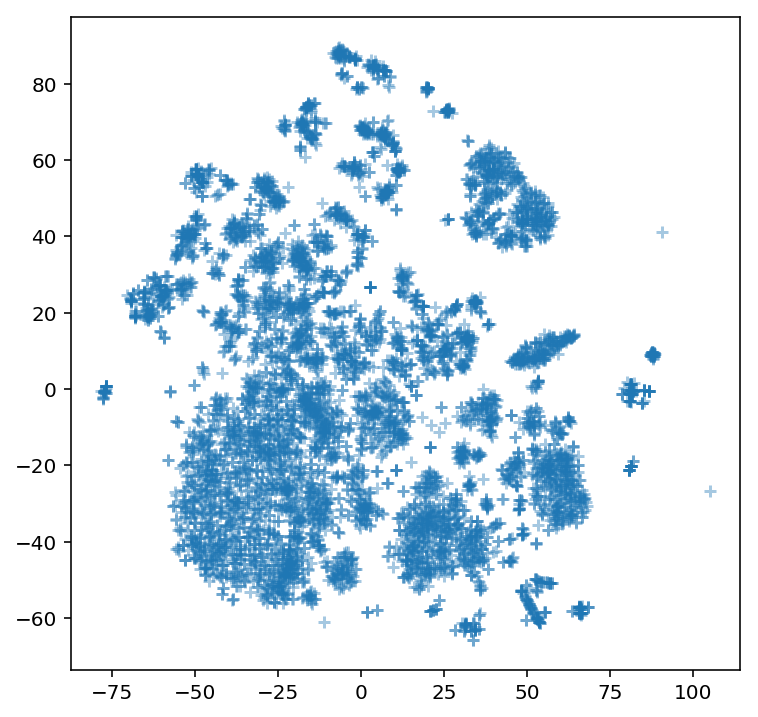

In [41]:
plt.figure(figsize=(6,6))
plt.scatter(X_TSNE[:, 0], X_TSNE[:, 1], alpha=0.4, marker='+')
plt.show()

In [79]:
# ix_under = (y2_label[:, 0] == 1)
# ix_normal = (y2_label[:, 1] == 1)
# ix_over = (y2_label[:, 2] == 1)
# ix_obese = (y2_label[:, 3] == 1)

ix_obese = (y2_label == 1)
ix_not_obese = (y2_label == 0)

def get_label_from_ix(ix):
    return list(label_ix.keys())[list(label_ix.values()).index(ix)]

def is_obese(x):
    return 'obese' if x == 1 else 'not obese'

colors = ['#1b9e77','#d95f02','#7570b3','#e7298a']
obese_lab = [int(y2_label[i]) for i in range(y2_label.shape[0])]
# multi_lab = [np.where(y2_label[i] == 1)[0][0] for i in range(y2_label.shape[0])]

colors2 = [colors[el] for el in obese_lab]
# colors4 = [colors[el] for el in multi_lab]

labels2 = [is_obese(x) for x in obese_lab]
# labels4 = [get_label_from_ix(ix) for ix in multi_lab]

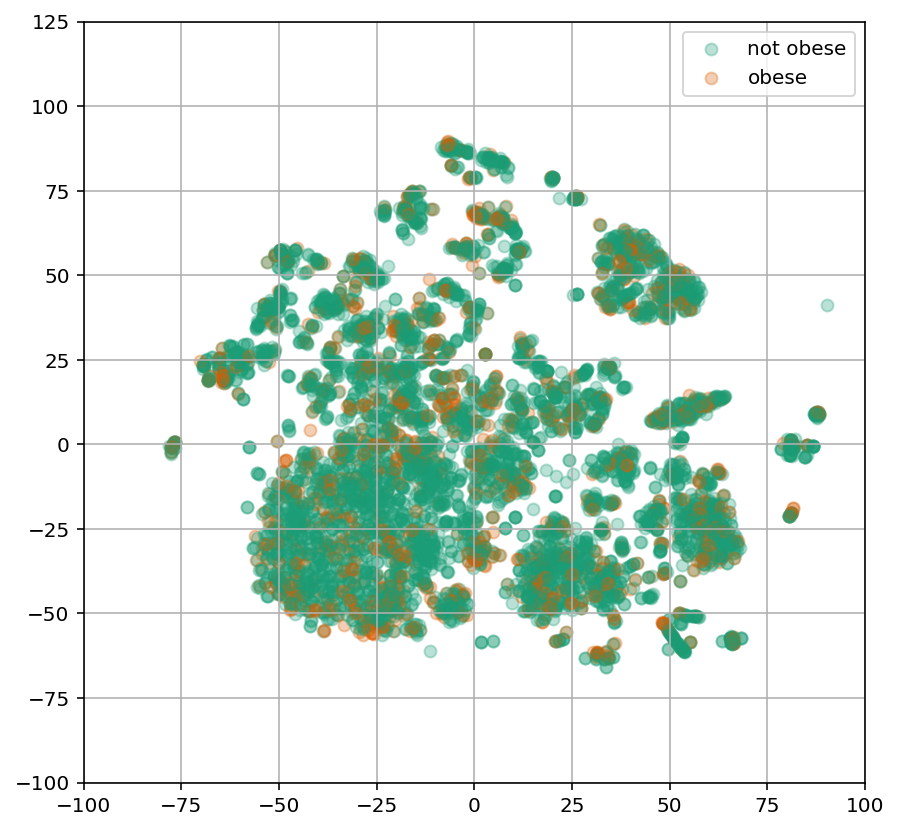

In [55]:
fig = plt.figure(figsize=(7,7))
ax = fig.add_subplot(111)

ax.set_xlim(-100, 100)
ax.set_ylim(-100, 125)
for (x, y), c, l in zip(X_TSNE, colors2, labels2):
    ax.scatter(x, y, color=c, label=l, alpha=0.3)
    ax.grid(True)
    
handles, labels = ax.get_legend_handles_labels()
hl = list(set((handle, label) for handle, label in zip(handles, labels)))
new=dict()
for h,l in zip(handles,labels):
    if l not in new:
        new[l]=h
handles=[]
labels=[]
for l in new.keys():
    handles.append(new[l])
    labels.append(l)
    
ax.legend(handles, labels)
plt.show()

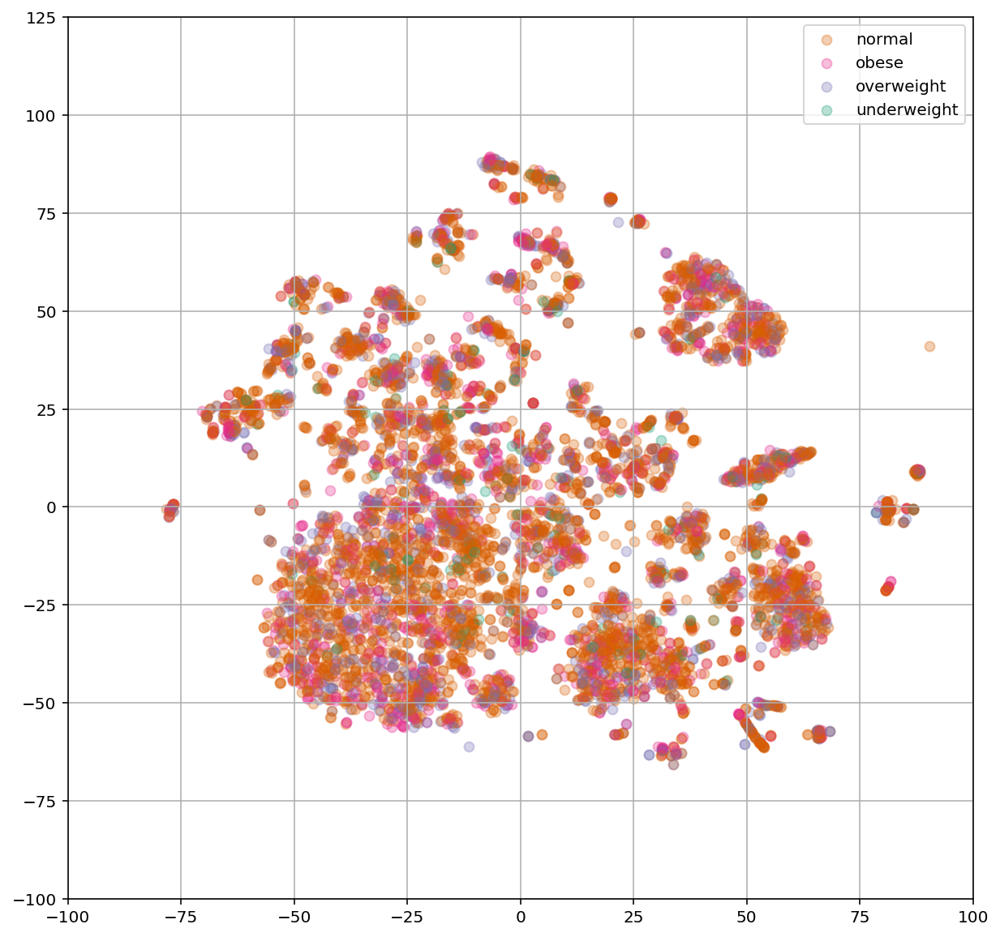

In [56]:
# plt.figure(figsize=(10, 10))
# plt.scatter(X_TSNE[ix_under][:, 0], X_TSNE[ix_under][:, 1], alpha=1, label='Underweight')
# plt.scatter(X_TSNE[ix_normal][:, 0], X_TSNE[ix_normal][:, 1], alpha=0.5, label='Normal weight')
# plt.scatter(X_TSNE[ix_over][:, 0], X_TSNE[ix_over][:, 1], alpha=0.5, label='Overweight')
# plt.scatter(X_TSNE[ix_obese][:, 0], X_TSNE[ix_obese][:, 1], alpha=0.5, label='Obese')
# plt.legend()
# plt.show()

fig = plt.figure(figsize=(10,10))
ax = fig.add_subplot(111)

ax.set_xlim(-100, 100)
ax.set_ylim(-100, 125)
for (x, y), c, l in zip(X_TSNE, colors4, labels4):
    ax.scatter(x, y, color=c, label=l, alpha=0.3)
    ax.grid(True)
    
handles, labels = ax.get_legend_handles_labels()
hl = list(set((handle, label) for handle, label in zip(handles, labels)))
new=dict()
for h,l in zip(handles,labels):
    if l not in new:
        new[l]=h
handles=[]
labels=[]
for l in new.keys():
    handles.append(new[l])
    labels.append(l)
    
ax.legend(handles, labels)
plt.show()

In [75]:
tsne = TSNE(perplexity=20, learning_rate=500)
X_vital_TSNE = tsne.fit_transform(xnorm)

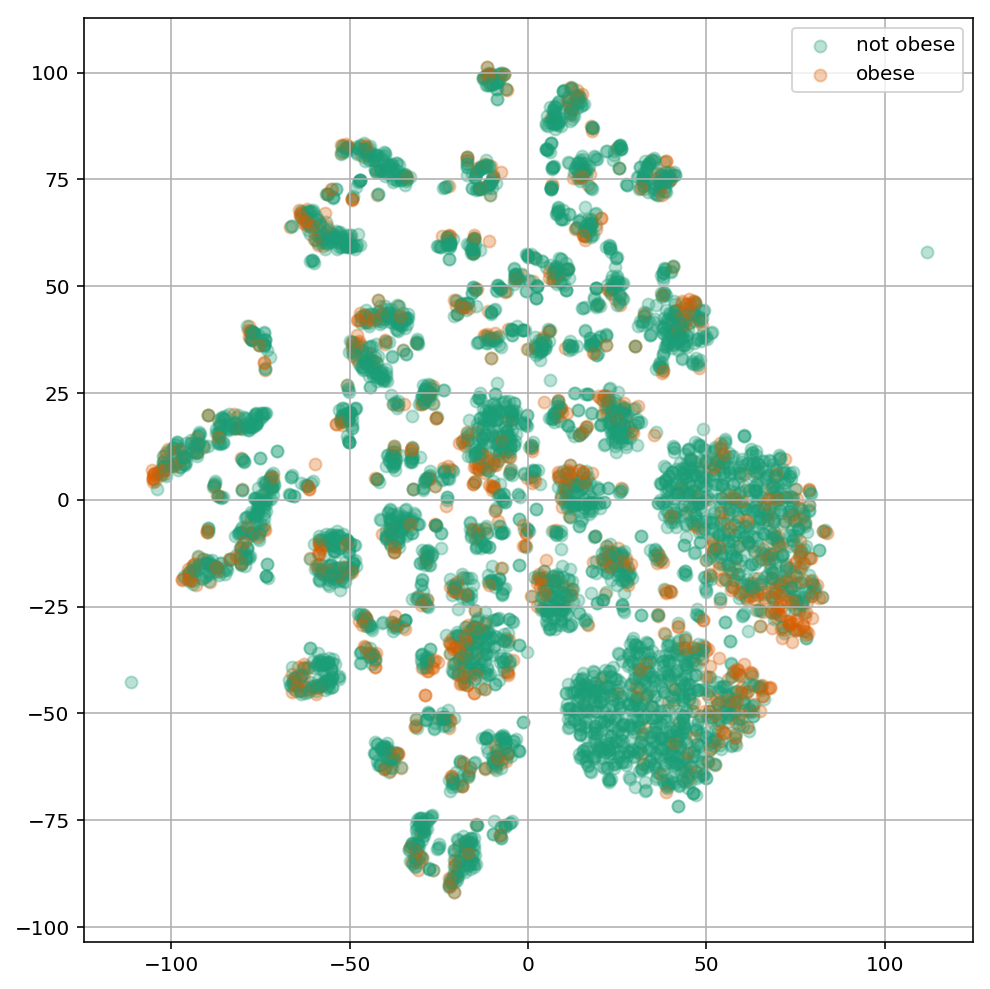

In [81]:
fig = plt.figure(figsize=(7,7))
ax = fig.add_subplot(111)

# ax.set_xlim(-100, 100)
# ax.set_ylim(-100, 125)
for (x, y), c, l in zip(X_vital_TSNE, colors2, labels2):
    ax.scatter(x, y, color=c, label=l, alpha=0.3)
    ax.grid(True)
    
handles, labels = ax.get_legend_handles_labels()
hl = list(set((handle, label) for handle, label in zip(handles, labels)))
new=dict()
for h,l in zip(handles,labels):
    if l not in new:
        new[l]=h
handles=[]
labels=[]
for l in new.keys():
    handles.append(new[l])
    labels.append(l)
    
ax.legend(handles, labels)
plt.tight_layout()
plt.savefig('tSNE_vital.png', dpi=300, bbox_to_inches=True)
plt.show()

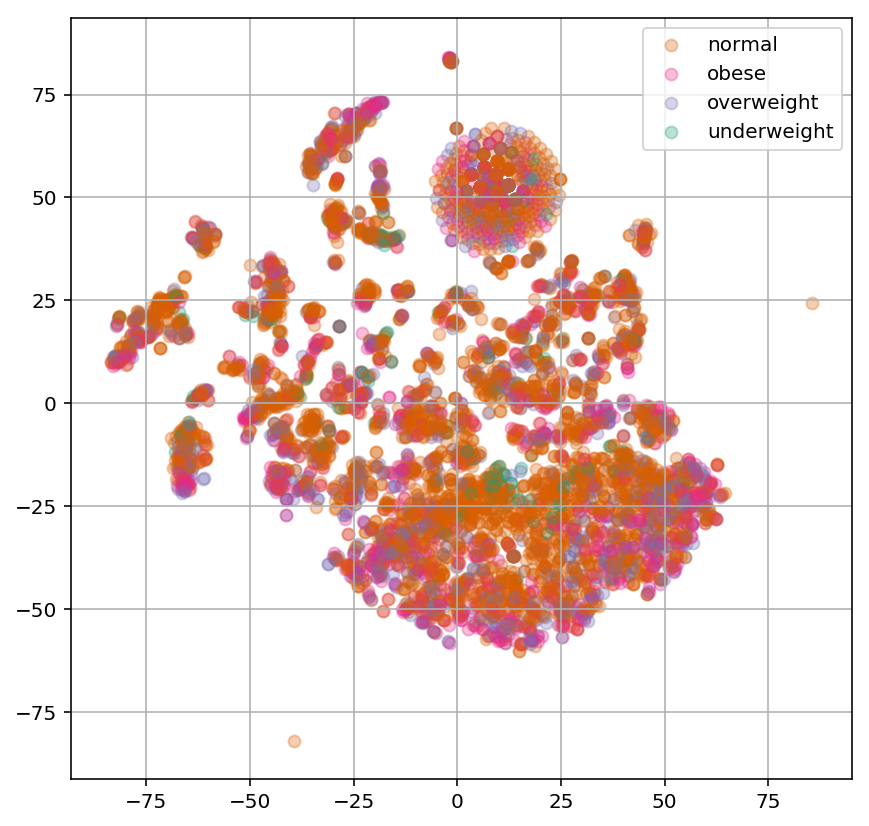

In [52]:
fig = plt.figure(figsize=(7,7))
ax = fig.add_subplot(111)

for (x, y), c, l in zip(X_vital_TSNE, colors4, labels4):
    ax.scatter(x, y, color=c, label=l, alpha=0.3)
    ax.grid(True)
    
handles, labels = ax.get_legend_handles_labels()
hl = list(set((handle, label) for handle, label in zip(handles, labels)))
new=dict()
for h,l in zip(handles,labels):
    if l not in new:
        new[l]=h
handles=[]
labels=[]
for l in new.keys():
    handles.append(new[l])
    labels.append(l)
    
ax.legend(handles, labels)
plt.show()

In [175]:
tsne = TSNE(n_components=2, perplexity=5)
X_vital_TSNE = tsne.fit_transform(xnorm[y2_label[:, 2] == 0])

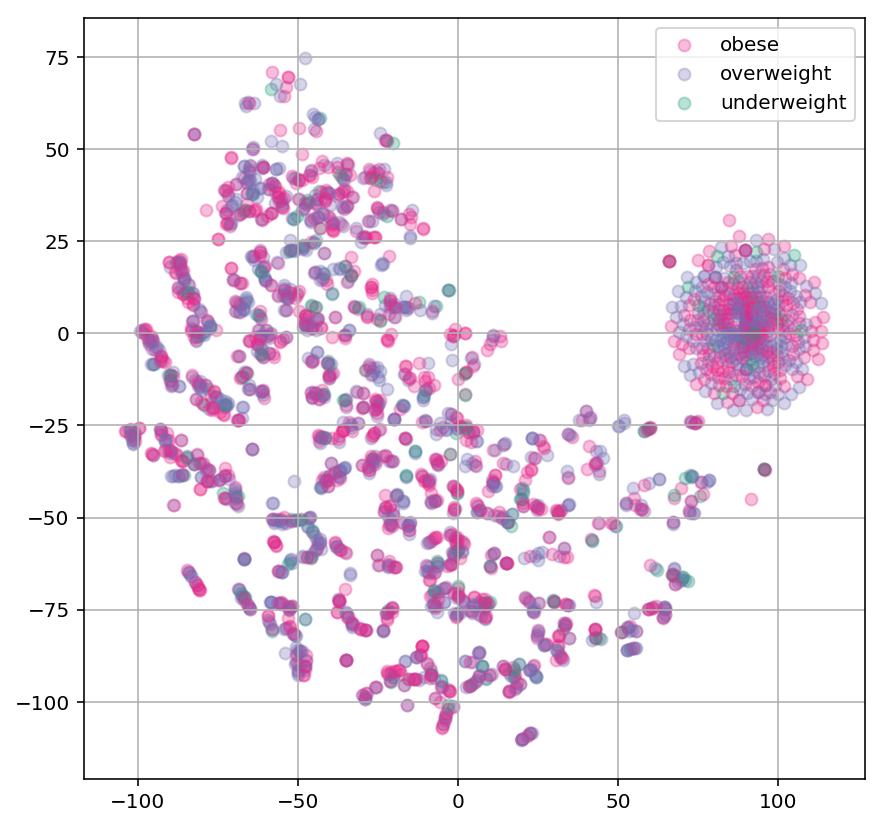

In [186]:
col4 = np.array([colors[el] for el in multi_lab])[y2_label[:, 1] == 0]
lab4 = np.array([get_label_from_ix(ix) for ix in multi_lab])[y2_label[:, 1] == 0]

fig = plt.figure(figsize=(7,7))
ax = fig.add_subplot(111)

for (x, y), c, l in zip(X_vital_TSNE, col4, lab4):
    ax.scatter(x, y, color=c, label=l, alpha=0.3)
    ax.grid(True)
    
handles, labels = ax.get_legend_handles_labels()
hl = list(set((handle, label) for handle, label in zip(handles, labels)))
new=dict()
for h,l in zip(handles,labels):
    if l not in new:
        new[l]=h
handles=[]
labels=[]
for l in new.keys():
    handles.append(new[l])
    labels.append(l)
    
ax.legend(handles, labels)
plt.show()

In [179]:
from sklearn.cluster import KMeans

In [180]:
clf = KMeans(n_clusters=4, n_jobs=-1)

In [181]:
clf.fit(X_vital_TSNE)

KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
    n_clusters=4, n_init=10, n_jobs=-1, precompute_distances='auto',
    random_state=None, tol=0.0001, verbose=0)

In [183]:
yy = clf.predict(X_vital_TSNE)
yy

yy2 = np.zeros((X_vital_TSNE.shape[0], 4))
for ix in range(X_vital_TSNE.shape[0]):
    yy2[ix, yy[ix]] = 1

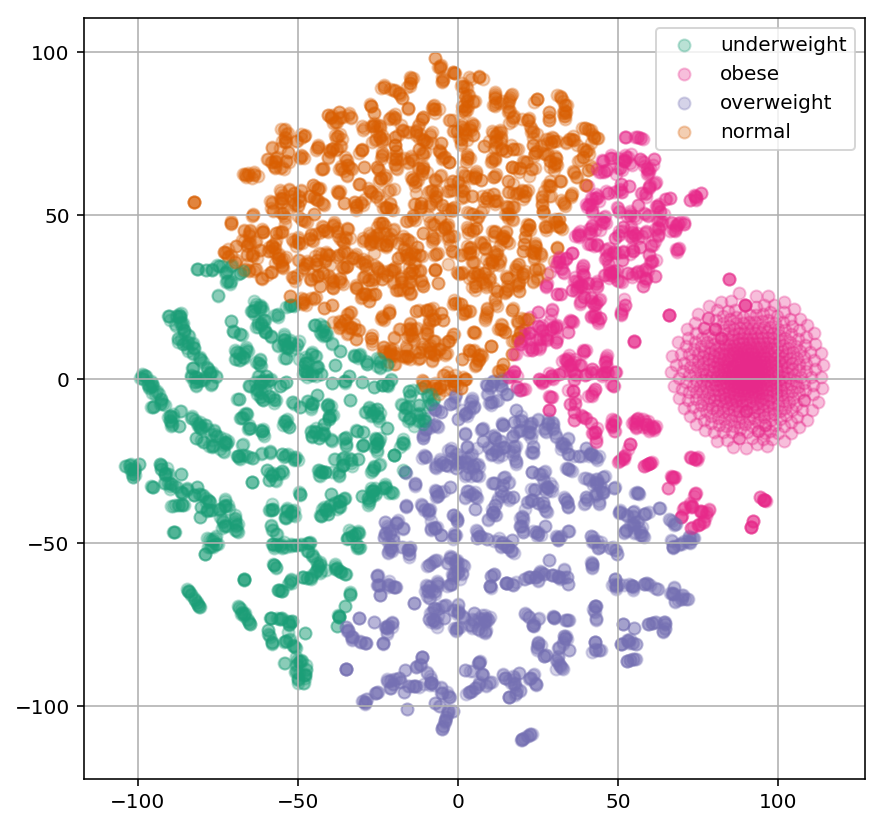

In [187]:
colors4 = [colors[el] for el in yy]
labels4 = [get_label_from_ix(ix) for ix in yy]

fig = plt.figure(figsize=(7,7))
ax = fig.add_subplot(111)

for (x, y), c, l in zip(X_vital_TSNE, colors4, labels4):
    ax.scatter(x, y, color=c, label=l, alpha=0.3)
    ax.grid(True)
    
handles, labels = ax.get_legend_handles_labels()
hl = list(set((handle, label) for handle, label in zip(handles, labels)))
new=dict()
for h,l in zip(handles,labels):
    if l not in new:
        new[l]=h
handles=[]
labels=[]
for l in new.keys():
    handles.append(new[l])
    labels.append(l)
    
ax.legend(handles, labels)
plt.show()

In [60]:
from sklearn.cluster import DBSCAN

In [61]:
dbscan = DBSCAN(min_samples=2)
clusters = dbscan.fit(x1_1[ix_filter_1][:, ft_filter])

In [62]:
clusters.labels_
np.unique(clusters.labels_)

array([-1,  0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15,
       16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32,
       33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49,
       50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66,
       67, 68])

In [63]:
clusters = dbscan.fit(X_vital_TSNE)
clusters.labels_
np.unique(clusters.labels_)

array([  -1,    0,    1, ..., 1286, 1287, 1288])

In [16]:
import config as config_file

In [17]:
try:
    icd9 = [l.strip().decode("utf-8")  for l in open(config_file.icd9List, 'rb').readlines()]
except:
    icd9 = [l.strip().decode('latin-1')  for l in open(config_file.icd9List, 'rb').readlines()]
try:
    icd10 = [l.strip().decode("utf-8")  for l in open(config_file.icd10List, 'rb').readlines()]
except:
    icd10 = [l.strip().decode('latin-1')   for l in open(config_file.icd10List, 'rb').readlines()]

In [64]:
icd9d = {}
icd9d_short = {}
for (ix, icd) in enumerate(icd9):
    if ix == 0:
        continue
    icd_codes = icd.split('|')[0].strip().split(' ')
    icd_codes_desc = icd.split('|')[1].strip()
    icd9d[icd_codes_desc] = icd_codes
    if icd_codes[0] != '' and len(icd_codes) != 1:
        codes = [''.join((code[:3], '.x')) if code[0].isnumeric() else ''.join((code[:4], '.x')) for code in icd_codes]
        icd9d_short[icd_codes_desc] = list(set(codes))

In [65]:
n = len(icd9d_short)
keys = list(icd9d_short.keys())
intersections = set()
for i, desc_i in enumerate(keys):
    for j in range(i+1, n-i):
        intersection = set(icd9d_short[desc_i]) & set(icd9d_short[keys[j]])
        if len(intersection) > 0:
            print(i, j, desc_i, keys[j], intersection)
            intersections.update(intersection)
            for code in icd9d[desc_i]:
                if any(code.startswith(x) for x in intersection):
                    if code in icd9d[keys[j]]:
                        print(code)

0 7 9ccs1:Tuberculosis 9ccs8:Oth infectns {'V120.x'}
0 76 9ccs1:Tuberculosis 9ccs78:Oth CNS infx {'V120.x'}
1 2 9ccs2:Septicemia 9ccs3:Oth bact inf {'022.x', '036.x', '020.x'}
1 6 9ccs2:Septicemia 9ccs7:Viral infect {'054.x', '790.x'}
1 48 9ccs2:Septicemia 9ccs49:DiabMel no c {'790.x'}
1 62 9ccs2:Septicemia 9ccs64:Ot hematl dx {'790.x'}
1 74 9ccs2:Septicemia 9ccs76:Meningitis {'054.x', '003.x', '036.x'}
1 75 9ccs2:Septicemia 9ccs77:Encephalitis {'054.x', '036.x'}
1 86 9ccs2:Septicemia 9ccs90:Eye infectn {'054.x'}
1 93 9ccs2:Septicemia 9ccs97:Carditis {'036.x'}
1 118 9ccs2:Septicemia 9ccs122:Pneumonia {'022.x', '003.x', '020.x'}
1 130 9ccs2:Septicemia 9ccs135:Intest infct {'022.x', '003.x'}
1 146 9ccs2:Septicemia 9ccs151:Oth liver dx {'790.x'}
1 191 9ccs2:Septicemia 9ccs197:Skin infectn {'022.x', '020.x'}
1 195 9ccs2:Septicemia 9ccs201:Infect arth {'003.x', '036.x'}
1 250 9ccs2:Septicemia 9ccs259:Unclassified {'790.x'}
2 4 9ccs3:Oth bact inf 9ccs5:HIV infectn {'795.x'}
2 9 9ccs3:Oth bac

In [73]:
icd9_list = [['9ccsCCS CATEGORY:CCS CATEGORY DESCRIPTION', 'ICD-9-CM CODE']]
for (ix, icd) in enumerate(icd9):
    if ix == 0:
        continue
    icd_codes = icd.split('|')[0].strip().split(' ')
    icd_codes_desc = icd.split('|')[1].strip()
    icd9d[icd_codes_desc] = icd_codes
    if icd_codes[0] != '' and len(icd_codes) != 1:
        codes = []
        for code in icd_codes:
            if code[0].isnumeric():
                beginning, end = code[:3], code[3:]
            else:
                beginning, end = code[:4], code[4:]
            new = '.'.join((beginning, 'x'))
            if new in intersections:
                new = '.'.join((new.split('.')[0], end))
            codes.append(new)
        codes = list(set(codes))
        icd_codes = codes
    icd_list = [['', code] for code in icd_codes]
    icd_list[0][0] = icd_codes_desc
    icd9_list += icd_list
icd9_list

[['9ccsCCS CATEGORY:CCS CATEGORY DESCRIPTION', 'ICD-9-CM CODE'],
 ['9ccs0:No DX', ''],
 ['9ccs1:Tuberculosis', '013.x'],
 ['', '012.x'],
 ['', '011.x'],
 ['', 'V120.1'],
 ['', '010.x'],
 ['', '014.x'],
 ['', '017.x'],
 ['', '015.x'],
 ['', '018.x'],
 ['', '137.x'],
 ['', '016.x'],
 ['9ccs2:Septicemia', '790.7'],
 ['', '036.2'],
 ['', '054.5'],
 ['', '020.2'],
 ['', '038.x'],
 ['', '449.x'],
 ['', '003.1'],
 ['', '022.3'],
 ['9ccs3:Oth bact inf', 'V094.x'],
 ['', '020.9'],
 ['', '040.82'],
 ['', '040.89'],
 ['', '024.x'],
 ['', '039.2'],
 ['', '036.9'],
 ['', '037.x'],
 ['', '030.x'],
 ['', '392.9'],
 ['', '036.89'],
 ['', '795.39'],
 ['', '021.9'],
 ['', '032.9'],
 ['', '027.x'],
 ['', '022.9'],
 ['', '039.3'],
 ['', '031.2'],
 ['', '033.x'],
 ['', '036.81'],
 ['', '039.9'],
 ['', '390.x'],
 ['', 'V091.x'],
 ['', '032.89'],
 ['', '040.42'],
 ['', 'V096.x'],
 ['', '040.0'],
 ['', '025.x'],
 ['', '026.9'],
 ['', 'V099.x'],
 ['', '040.3'],
 ['', '026.0'],
 ['', '040.2'],
 ['', '795.3'],
 

In [74]:
len(intersections), len(icd9_list)

(120, 3571)

In [75]:
icd10d = {}
icd10d_short = {}
for (ix, icd) in enumerate(icd10):
    if ix == 0:
        continue
    icd_codes = icd.split('|')[0].strip().split(' ')
    icd_codes_desc = icd.split('|')[1].strip()
    icd10d[icd_codes_desc] = icd_codes
    if icd_codes[0] != '' and len(icd_codes) != 1:
        codes = [''.join((code[:3], '.x')) if len(code) > 3 else code for code in icd_codes]
        icd10d_short[icd_codes_desc] = list(set(codes))

n = len(icd10d_short)
keys = list(icd10d_short.keys())
intersections = set()
for i, desc_i in enumerate(keys):
    for j in range(i+1, n-i):
        intersection = set(icd10d_short[desc_i]) & set(icd10d_short[keys[j]])
        if len(intersection) > 0:
            print(i, j, desc_i, keys[j], intersection)
            intersections.update(intersection)
            for code in icd10d[desc_i]:
                if any(code.startswith(x) for x in intersection):
                    if code in icd10d[keys[j]]:
                        print(code)

0 2 10ccs1:Tuberculosis 10ccs3:Oth bact inf {'Z86.x'}
0 7 10ccs1:Tuberculosis 10ccs8:Oth infectns {'Z86.x'}
0 23 10ccs1:Tuberculosis 10ccs24:Breast cancr {'Z86.x'}
0 25 10ccs1:Tuberculosis 10ccs26:Cervix cancr {'Z86.x'}
0 40 10ccs1:Tuberculosis 10ccs41:Ot primry ca {'Z86.x'}
0 46 10ccs1:Tuberculosis 10ccs47:Ot bnign neo {'Z86.x'}
0 57 10ccs1:Tuberculosis 10ccs58:Ot nutrit dx {'Z86.x'}
0 58 10ccs1:Tuberculosis 10ccs59:Anemia {'Z86.x'}
0 62 10ccs1:Tuberculosis 10ccs64:Ot hematl dx {'Z86.x'}
0 65 10ccs1:Tuberculosis 10ccs78:Oth CNS infx {'Z86.x'}
0 80 10ccs1:Tuberculosis 10ccs95:Oth nerv dx {'Z86.x'}
0 87 10ccs1:Tuberculosis 10ccs103:Pulm hart dx {'Z86.x'}
0 101 10ccs1:Tuberculosis 10ccs117:Ot circul dx {'Z86.x'}
0 102 10ccs1:Tuberculosis 10ccs118:Phlebitis {'Z86.x'}
0 168 10ccs1:Tuberculosis 10ccs186:DM in preg {'Z86.x'}
0 252 10ccs1:Tuberculosis 10ccs663 {'Z86.x'}
1 2 10ccs2:Septicemia 10ccs3:Oth bact inf {'A32.x', 'A20.x', 'A26.x', 'A42.x', 'A39.x', 'A22.x'}
1 3 10ccs2:Septicemia 10ccs

26 38 10ccs27:Ovary cancer 10ccs39:Leukemias {'Z85.x'}
26 40 10ccs27:Ovary cancer 10ccs41:Ot primry ca {'Z85.x'}
27 28 10ccs28:Fem genit ca 10ccs29:Prostate can {'D07.x', 'Z85.x'}
27 29 10ccs28:Fem genit ca 10ccs30:Testis cancr {'Z85.x'}
27 30 10ccs28:Fem genit ca 10ccs31:Mal genit ca {'D07.x', 'Z85.x'}
27 31 10ccs28:Fem genit ca 10ccs32:Bladder cncr {'Z85.x'}
27 32 10ccs28:Fem genit ca 10ccs33:Kidny/rnl ca {'Z85.x'}
27 33 10ccs28:Fem genit ca 10ccs34:Uriny org ca {'Z85.x'}
27 34 10ccs28:Fem genit ca 10ccs35:Brain/ns can {'Z85.x'}
27 35 10ccs28:Fem genit ca 10ccs36:Thyroid cncr {'Z85.x'}
27 36 10ccs28:Fem genit ca 10ccs37:Hodgkin-s ds {'Z85.x'}
27 37 10ccs28:Fem genit ca 10ccs38:Non-Hodg lym {'Z85.x'}
27 38 10ccs28:Fem genit ca 10ccs39:Leukemias {'Z85.x'}
27 40 10ccs28:Fem genit ca 10ccs41:Ot primry ca {'Z85.x'}
27 237 10ccs28:Fem genit ca 10ccs258:Other screen {'R87.x'}
28 29 10ccs29:Prostate can 10ccs30:Testis cancr {'Z85.x'}
28 30 10ccs29:Prostate can 10ccs31:Mal genit ca {'D07.x', 

85 88 10ccs101:Coron athero 10ccs104:Oth heart dx {'I25.x', 'I23.x'}
85 89 10ccs101:Coron athero 10ccs105:Conduction {'Z95.x'}
85 101 10ccs101:Coron athero 10ccs117:Ot circul dx {'Z95.x', 'Z98.x'}
85 119 10ccs101:Coron athero 10ccs136:Teeth dx {'Z98.x'}
85 137 10ccs101:Coron athero 10ccs155:Other GI dx {'Z98.x'}
85 158 10ccs101:Coron athero 10ccs176:Contraceptiv {'Z98.x'}
86 116 10ccs102:Chest pain 10ccs133:Oth low resp {'R07.x'}
86 117 10ccs102:Chest pain 10ccs134:Ot uppr resp {'R07.x'}
87 101 10ccs103:Pulm hart dx 10ccs117:Ot circul dx {'Z86.x'}
87 102 10ccs103:Pulm hart dx 10ccs118:Phlebitis {'Z86.x'}
87 168 10ccs103:Pulm hart dx 10ccs186:DM in preg {'Z86.x'}
89 101 10ccs105:Conduction 10ccs117:Ot circul dx {'Z95.x'}
90 91 10ccs106:Dysrhythmia 10ccs107:Cardia arrst {'I49.x'}
95 99 10ccs111:Other CVD 10ccs115:Aneurysm {'I67.x'}
98 101 10ccs114:Perip athero 10ccs117:Ot circul dx {'I73.x'}
98 137 10ccs114:Perip athero 10ccs155:Other GI dx {'K55.x'}
99 101 10ccs115:Aneurysm 10ccs117:Ot 

In [77]:
len(intersections)

166

In [79]:
icd10_list = [['10ccsCCS CATEGORY:CCS CATEGORY DESCRIPTION', 'ICD-10-CM CODE']]
for (ix, icd) in enumerate(icd10):
    if ix == 0:
        continue
    icd_codes = icd.split('|')[0].strip().split(' ')
    icd_codes_desc = icd.split('|')[1].strip()
    icd10d[icd_codes_desc] = icd_codes
    if icd_codes[0] != '' and len(icd_codes) != 1:
        codes = []
        for code in icd_codes:
            beginning, end = code[:3], code[3:]
            new = '.'.join((beginning, 'x'))
            if new in intersections:
                new = '.'.join((new.split('.')[0], end))
            codes.append(new)
        codes = list(set(codes))
        icd_codes = codes
    icd_list = [['', code] for code in icd_codes]
    icd_list[0][0] = icd_codes_desc
    icd10_list += icd_list
icd10_list

[['10ccsCCS CATEGORY:CCS CATEGORY DESCRIPTION', 'ICD-10-CM CODE'],
 ['10ccs1:Tuberculosis', 'A19.x'],
 ['', 'J65.x'],
 ['', 'A18.x'],
 ['', 'B90.x'],
 ['', 'A17.x'],
 ['', 'Z86.11'],
 ['', 'A15.x'],
 ['10ccs2:Septicemia', 'A41.x'],
 ['', 'A26.7'],
 ['', 'A40.x'],
 ['', 'A32.7'],
 ['', 'A54.86'],
 ['', 'A39.2'],
 ['', 'A02.1'],
 ['', 'B00.7'],
 ['', 'A20.7'],
 ['', 'A39.4'],
 ['', 'B37.7'],
 ['', 'A42.7'],
 ['', 'A39.3'],
 ['', 'I76.x'],
 ['', 'P36.x'],
 ['', 'A22.7'],
 ['', 'R65.20'],
 ['10ccs3:Oth bact inf', 'A28.x'],
 ['', 'A48.8'],
 ['', 'A48.2'],
 ['', 'A21.7'],
 ['', 'K90.81'],
 ['', 'Z86.14'],
 ['', 'A48.52'],
 ['', 'A37.91'],
 ['', 'A22.9'],
 ['', 'A24.x'],
 ['', 'A39.89'],
 ['', 'A48.4'],
 ['', 'A39.82'],
 ['', 'A26.9'],
 ['', 'A35.x'],
 ['', 'Z16.29'],
 ['', 'Z16.10'],
 ['', 'A21.8'],
 ['', 'A30.x'],
 ['', 'Z16.11'],
 ['', 'Z16.24'],
 ['', 'A43.9'],
 ['', 'A38.9'],
 ['', 'A37.90'],
 ['', 'A20.8'],
 ['', 'A39.1'],
 ['', 'A48.0'],
 ['', 'A20.0'],
 ['', 'A43.8'],
 ['', 'A32.81'],

In [82]:
import csv

icd9_list_ap = [[el1, "'" + el2] for el1, el2 in icd9_list]
with open("/Volumes/CPO/testing/icd9.csv",'w') as f:
    wr = csv.writer(f, dialect='excel')
    wr.writerows(icd9_list_ap)
    
with open("/Volumes/CPO/testing/icd10.csv",'w') as f:
    wr = csv.writer(f, dialect='excel')
    wr.writerows(icd10_list)

In [110]:
icd9_list = [['9ccsCCS CATEGORY:CCS CATEGORY DESCRIPTION', 'ICD-9-CM CODE']]
for (ix, icd) in enumerate(icd9):
    icd_codes = icd.split('|')[0].strip().split(' ')
    icd_codes_desc = icd.split('|')[1].strip()
    icd_list = [['', code] for code in icd_codes]
    icd_list[0][0] = icd_codes_desc
    icd9_list += icd_list
    
icd10_list = [['10ccsCCS CATEGORY:CCS CATEGORY DESCRIPTION', 'ICD-10-CM CODE']]
for (ix, icd) in enumerate(icd10):
    icd_codes = icd.split('|')[0].strip().split(' ')
    icd_codes_desc = icd.split('|')[1].strip()
    icd_list = [['', code] for code in icd_codes]
    icd_list[0][0] = icd_codes_desc
    icd10_list += icd_list

del icd9_list[1:3]
del icd10_list[1:3]

In [121]:
import csv

icd9_list_ap = [[el1, "'" + el2] for el1, el2 in icd9_list]
with open("/Volumes/CPO/testing/icd9.csv",'w') as f:
    wr = csv.writer(f, dialect='excel')
    wr.writerows(icd9_list_ap)
    
icd10_list_ap = [[el1, "'" + el2] for el1, el2 in icd10_list]
with open("/Volumes/CPO/testing/icd10.csv",'w') as f:
    wr = csv.writer(f, dialect='excel')
    wr.writerows(icd10_list_ap)

In [119]:
pprint(icd9_list)

[['9ccsCCS CATEGORY:CCS CATEGORY DESCRIPTION', 'ICD-9-CM CODE'],
 ['9ccs0:No DX', ''],
 ['9ccs1:Tuberculosis', '01000'],
 ['', '01001'],
 ['', '01002'],
 ['', '01003'],
 ['', '01004'],
 ['', '01005'],
 ['', '01006'],
 ['', '01010'],
 ['', '01011'],
 ['', '01012'],
 ['', '01013'],
 ['', '01014'],
 ['', '01015'],
 ['', '01016'],
 ['', '01080'],
 ['', '01081'],
 ['', '01082'],
 ['', '01083'],
 ['', '01084'],
 ['', '01085'],
 ['', '01086'],
 ['', '01090'],
 ['', '01091'],
 ['', '01092'],
 ['', '01093'],
 ['', '01094'],
 ['', '01095'],
 ['', '01096'],
 ['', '01100'],
 ['', '01101'],
 ['', '01102'],
 ['', '01103'],
 ['', '01104'],
 ['', '01105'],
 ['', '01106'],
 ['', '01110'],
 ['', '01111'],
 ['', '01112'],
 ['', '01113'],
 ['', '01114'],
 ['', '01115'],
 ['', '01116'],
 ['', '01120'],
 ['', '01121'],
 ['', '01122'],
 ['', '01123'],
 ['', '01124'],
 ['', '01125'],
 ['', '01126'],
 ['', '01130'],
 ['', '01131'],
 ['', '01132'],
 ['', '01133'],
 ['', '01134'],
 ['', '01135'],
 ['', '01136'],

 ['', '71281'],
 ['', '71282'],
 ['', '71283'],
 ['', '71284'],
 ['', '71285'],
 ['', '71286'],
 ['', '71287'],
 ['', '71288'],
 ['', '71289'],
 ['', '71290'],
 ['', '71291'],
 ['', '71292'],
 ['', '71293'],
 ['', '71294'],
 ['', '71295'],
 ['', '71296'],
 ['', '71297'],
 ['', '71298'],
 ['', '71299'],
 ['9ccs55:Fluid/elc dx', '2760'],
 ['', '2761'],
 ['', '2762'],
 ['', '2763'],
 ['', '2764'],
 ['', '2765'],
 ['', '27650'],
 ['', '27651'],
 ['', '27652'],
 ['', '2766'],
 ['', '2767'],
 ['', '2768'],
 ['', '2769'],
 ['9ccs56:Cystic fibro', '27700'],
 ['', '27701'],
 ['', '27702'],
 ['', '27703'],
 ['', '27709'],
 ['9ccs57:Immunity dx', '27900'],
 ['', '27901'],
 ['', '27902'],
 ['', '27903'],
 ['', '27904'],
 ['', '27905'],
 ['', '27906'],
 ['', '27909'],
 ['', '27911'],
 ['', '27912'],
 ['', '27913'],
 ['', '2792'],
 ['', '2793'],
 ['', '2794'],
 ['', '2798'],
 ['', '2799'],
 ['9ccs58:Ot nutrit dx', '2700'],
 ['', '2701'],
 ['', '2702'],
 ['', '2703'],
 ['', '2704'],
 ['', '2705'],
 [

 ['', '38632'],
 ['', '38633'],
 ['', '38634'],
 ['', '38635'],
 ['', '38640'],
 ['', '38641'],
 ['', '38642'],
 ['', '38643'],
 ['', '38648'],
 ['', '38650'],
 ['', '38651'],
 ['', '38652'],
 ['', '38653'],
 ['', '38654'],
 ['', '38655'],
 ['', '38656'],
 ['', '38658'],
 ['', '3868'],
 ['', '3869'],
 ['', '7804'],
 ['9ccs94:Other ear dx', '38000'],
 ['', '38001'],
 ['', '38002'],
 ['', '38003'],
 ['', '38010'],
 ['', '38011'],
 ['', '38012'],
 ['', '38013'],
 ['', '38014'],
 ['', '38015'],
 ['', '38016'],
 ['', '38021'],
 ['', '38022'],
 ['', '38023'],
 ['', '38030'],
 ['', '38031'],
 ['', '38032'],
 ['', '38039'],
 ['', '3804'],
 ['', '38050'],
 ['', '38051'],
 ['', '38052'],
 ['', '38053'],
 ['', '38081'],
 ['', '38089'],
 ['', '3809'],
 ['', '38400'],
 ['', '38401'],
 ['', '38409'],
 ['', '3841'],
 ['', '38530'],
 ['', '38531'],
 ['', '38532'],
 ['', '38533'],
 ['', '38535'],
 ['', '38582'],
 ['', '38583'],
 ['', '38589'],
 ['', '3859'],
 ['', '38800'],
 ['', '38801'],
 ['', '38802

 ['', '63732'],
 ['', '63740'],
 ['', '63741'],
 ['', '63742'],
 ['', '63750'],
 ['', '63751'],
 ['', '63752'],
 ['', '63760'],
 ['', '63761'],
 ['', '63762'],
 ['', '63770'],
 ['', '63771'],
 ['', '63772'],
 ['', '63780'],
 ['', '63781'],
 ['', '63782'],
 ['', '63790'],
 ['', '63791'],
 ['', '63792'],
 ['', '6380'],
 ['', '6381'],
 ['', '6382'],
 ['', '6383'],
 ['', '6384'],
 ['', '6385'],
 ['', '6386'],
 ['', '6387'],
 ['', '6388'],
 ['', '6389'],
 ['9ccs179:Abort compl', '6390'],
 ['', '6391'],
 ['', '6392'],
 ['', '6393'],
 ['', '6394'],
 ['', '6395'],
 ['', '6396'],
 ['', '6398'],
 ['', '6399'],
 ['9ccs180:Ectopic preg', '6330'],
 ['', '63300'],
 ['', '63301'],
 ['', '6331'],
 ['', '63310'],
 ['', '63311'],
 ['', '6332'],
 ['', '63320'],
 ['', '63321'],
 ['', '6338'],
 ['', '63380'],
 ['', '63381'],
 ['', '6339'],
 ['', '63390'],
 ['', '63391'],
 ['9ccs181:Ot preg comp', '630'],
 ['', '631'],
 ['', '632'],
 ['', '64300'],
 ['', '64301'],
 ['', '64303'],
 ['', '64310'],
 ['', '6431

 ['', '7320'],
 ['', '7321'],
 ['', '7322'],
 ['', '7323'],
 ['', '7324'],
 ['', '7325'],
 ['', '7326'],
 ['', '7327'],
 ['', '7328'],
 ['', '7329'],
 ['', '73320'],
 ['', '73321'],
 ['', '73322'],
 ['', '73329'],
 ['', '7333'],
 ['', '73340'],
 ['', '73341'],
 ['', '73342'],
 ['', '73343'],
 ['', '73344'],
 ['', '73345'],
 ['', '73349'],
 ['', '7335'],
 ['', '7336'],
 ['', '7337'],
 ['', '73381'],
 ['', '73382'],
 ['', '73390'],
 ['', '73391'],
 ['', '73392'],
 ['', '73399'],
 ['', '73730'],
 ['', '73731'],
 ['', '73732'],
 ['', '7390'],
 ['', '7391'],
 ['', '7392'],
 ['', '7393'],
 ['', '7394'],
 ['', '7395'],
 ['', '7396'],
 ['', '7397'],
 ['', '7398'],
 ['', '7399'],
 ['', 'V424'],
 ['', 'V486'],
 ['', 'V487'],
 ['', 'V494'],
 ['9ccs213:Cardiac anom', '7450'],
 ['', '74510'],
 ['', '74511'],
 ['', '74512'],
 ['', '74519'],
 ['', '7452'],
 ['', '7453'],
 ['', '7454'],
 ['', '7455'],
 ['', '74560'],
 ['', '74561'],
 ['', '74569'],
 ['', '7457'],
 ['', '7458'],
 ['', '7459'],
 ['', '7

 ['', '86412'],
 ['', '86413'],
 ['', '86414'],
 ['', '86415'],
 ['', '86419'],
 ['', '86500'],
 ['', '86501'],
 ['', '86502'],
 ['', '86503'],
 ['', '86504'],
 ['', '86509'],
 ['', '86510'],
 ['', '86511'],
 ['', '86512'],
 ['', '86513'],
 ['', '86514'],
 ['', '86519'],
 ['', '86600'],
 ['', '86601'],
 ['', '86602'],
 ['', '86603'],
 ['', '86610'],
 ['', '86611'],
 ['', '86612'],
 ['', '86613'],
 ['', '8670'],
 ['', '8671'],
 ['', '8672'],
 ['', '8673'],
 ['', '8674'],
 ['', '8675'],
 ['', '8676'],
 ['', '8677'],
 ['', '8678'],
 ['', '8679'],
 ['', '86800'],
 ['', '86801'],
 ['', '86802'],
 ['', '86803'],
 ['', '86804'],
 ['', '86809'],
 ['', '86810'],
 ['', '86811'],
 ['', '86812'],
 ['', '86813'],
 ['', '86814'],
 ['', '86819'],
 ['', '8690'],
 ['', '8691'],
 ['', '90000'],
 ['', '90001'],
 ['', '90002'],
 ['', '90003'],
 ['', '9001'],
 ['', '90081'],
 ['', '90082'],
 ['', '90089'],
 ['', '9009'],
 ['', '9010'],
 ['', '9011'],
 ['', '9012'],
 ['', '9013'],
 ['', '90140'],
 ['', '901

 ['', 'E8260'],
 ['', 'E8270'],
 ['', 'E8280'],
 ['', 'E8290'],
 ['9ccs2610:e codes: transport- not mvt', 'E8000'],
 ['', 'E8001'],
 ['', 'E8008'],
 ['', 'E8009'],
 ['', 'E8010'],
 ['', 'E8011'],
 ['', 'E8018'],
 ['', 'E8019'],
 ['', 'E8020'],
 ['', 'E8021'],
 ['', 'E8028'],
 ['', 'E8029'],
 ['', 'E8030'],
 ['', 'E8031'],
 ['', 'E8038'],
 ['', 'E8039'],
 ['', 'E8040'],
 ['', 'E8041'],
 ['', 'E8048'],
 ['', 'E8049'],
 ['', 'E8050'],
 ['', 'E8051'],
 ['', 'E8058'],
 ['', 'E8059'],
 ['', 'E8060'],
 ['', 'E8061'],
 ['', 'E8068'],
 ['', 'E8069'],
 ['', 'E8070'],
 ['', 'E8071'],
 ['', 'E8078'],
 ['', 'E8079'],
 ['', 'E8200'],
 ['', 'E8201'],
 ['', 'E8202'],
 ['', 'E8203'],
 ['', 'E8204'],
 ['', 'E8205'],
 ['', 'E8208'],
 ['', 'E8209'],
 ['', 'E8210'],
 ['', 'E8211'],
 ['', 'E8212'],
 ['', 'E8213'],
 ['', 'E8214'],
 ['', 'E8215'],
 ['', 'E8218'],
 ['', 'E8219'],
 ['', 'E8220'],
 ['', 'E8221'],
 ['', 'E8222'],
 ['', 'E8223'],
 ['', 'E8224'],
 ['', 'E8225'],
 ['', 'E8228'],
 ['', 'E8229'],
 [''